<h1 style = 'color : goldenrod', align = 'center'><u>Optimize the power consumption of Zone 1 based on various environmental and meteorological factors in Wellington, New-Zealand</u></h1>


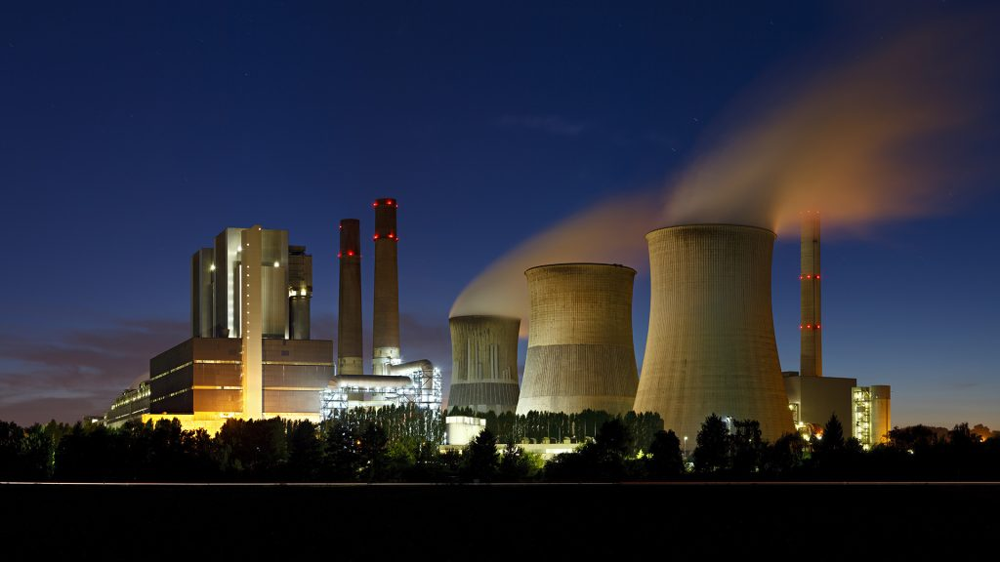

<h2 style = 'color : burlywood'><u>Problem Statement</u></h2>

The objective is to develop a machine learning model that can predict the power consumption (Zone 1 Power Consumption) of Wellington, New Zealand based on various environmental and meteorological factors. The goal is to create an accurate predictive model that can assist in managing energy resources efficiently and optimizing power consumption in that zone.


<h2 style = 'color : sandybrown'><u>Data Dictionary</u></h2>

* **Sr no.:** Serial Number
* **Temperature:** The temperature in Celsius at the specific location.
* **Humidity:** The relative humidity percentage at the location. (g.m-3, i.e. units of grams of water vapor per cubic meter of air. )
* **Wind Speed:** The speed of the wind at the location. (nautical mile per hour )
* **General Diffuse Flows:** Refer to a specific measurement or calculation related to the amount or intensity of diffuse solar radiation in a particular area. (Mtr sqr per sec )
* **Diffuse Flows:** The measure of diffuse solar radiation. (Mtr sqr per sec )
* **Air Quality Index:** An index representing the air quality in the area. (particles in micrograms per cubic meter. )
* **Cloudiness:** The level of cloud cover or cloudiness at the location. (1-Yes,0-No)
* **Zone 1 Power Consumption:** The power consumption in the specific zone, which is the target variable to be predicted. (in KWR- **Target value**)


### Importing the dependencies

In [361]:
import os  # File and folder operations                     
import pandas as pd  # Data Manipulation  
import numpy as np   # Numeric calculations
import matplotlib.pyplot as plt   # Visualization
%matplotlib inline   
# To keep the visualization within a cell
import seaborn as sns   # Advanced data visualization
sns.set()   # Setting the seaborn formatting
import plotly.express as px  # Interactive data visualization
import warnings # Remove unnecessary warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None) # To dislay all the rows

from sklearn.neighbors import KNeighborsRegressor  # To implement K nearest regression
from sklearn.linear_model import LinearRegression  # To implement Linear Regression
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor     # To implement Decision Tree
from sklearn.ensemble import RandomForestRegressor # To implement Random Forest
from xgboost import XGBRegressor                   # To impelement Xgboost
from lightgbm import LGBMRegressor                 # To implement Light Gradient Boosting
from catboost import CatBoostRegressor             # To implement Cat Boost Regressor
from sklearn.model_selection import train_test_split # To split the dataset into training and testing
from sklearn.model_selection import GridSearchCV  # To perform Hyperparameter tuning.
from sklearn.preprocessing import StandardScaler, MinMaxScaler # To scale the features
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error # To Evaluate the model
from sklearn.decomposition import PCA  # Dimensionality Reduction technique.
import sweetviz as sv  # Data Visualizatio using Automation

import tensorflow as tf  # MLP Framework
from tensorflow import keras  # Wrapper for using MLP
from keras import Sequential  # Sequential Model
from keras.layers import Dense, Dropout, BatchNormalization  # MLP layers
from keras.callbacks import EarlyStopping  # Early Stopping to stop execution based on some metric.

### Reading the data

In [3]:
df = pd.read_csv('Data.csv')  # Storing the data in pandas DataFrame object after reading it from Data.csv file

In [4]:
df.head()   # Displaying first 5 rows

,S no,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Air Quality Index (PM),Cloudiness,Power Consumption in A Zone
0,1,6.559,73.8,0.083,0.051,0.119,158.0,1,34055.69620
1,2,6.414,74.5,0.083,0.070,0.085,159.0,1,29814.68354
2,3,6.313,74.5,0.08,0.062,0.100,151.0,1,29128.10127
3,4,6.121,75,0.083,0.091,0.096,151.0,1,28228.86076
4,5,5.921,75.7,0.081,0.048,0.085,154.0,1,27335.69620


In [5]:
df.shape # Rows in our data, Columns or features in data

(52583, 9)

In [19]:
df.columns # Checking all the feature names

Index(['S no', 'Temperature', 'Humidity', 'Wind Speed',
       'general diffuse flows', 'diffuse flows', 'Air Quality Index (PM)',
       'Cloudiness', ' Power Consumption in A Zone'],
      dtype='object')

##### We shall not be needing the 'S no' column as it is just a serial number and will not be used in EDA and will act as a noise in our model.
##### Lets remove that

In [23]:
df.drop('S no', axis = 1, inplace = True) # Dropping the 'S no' column and making the changes permanent by using the parameter inplace = True

##### We can see there is an extra space in our target feature i.e., Power Consumption. Lets fix that 

In [20]:
df.rename(columns = {' Power Consumption in A Zone' : 'Power Consumption in A Zone'}, inplace = True) # Renaming the column and making the changes permanent.

In [24]:
df.info()  # information regarding data type, memory consumption, null values, etc.,

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52583 entries, 0 to 52582
Data columns (total 8 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Temperature                  52260 non-null  float64
 1   Humidity                     52557 non-null  float64
 2   Wind Speed                   52508 non-null  float64
 3   general diffuse flows        52275 non-null  float64
 4   diffuse flows                52568 non-null  float64
 5   Air Quality Index (PM)       52565 non-null  float64
 6   Cloudiness                   52583 non-null  int64  
 7   Power Consumption in A Zone  52583 non-null  float64
dtypes: float64(7), int64(1)
memory usage: 3.2 MB


In [7]:
# We can see that the Temperature, Humidity and Wind Speed are given as 'Object' data types.
# But going by the data, that should not be the Case.

In [8]:
# Let us convert these into the required numerical columns

In [9]:
df[['Temperature', 'Humidity', 'Wind Speed']] = df[['Temperature', 'Humidity', 'Wind Speed']].apply(pd.to_numeric, errors = 'coerce')

In [10]:
# Let us check the result

In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52583 entries, 0 to 52582
Data columns (total 8 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Temperature                  52260 non-null  float64
 1   Humidity                     52557 non-null  float64
 2   Wind Speed                   52508 non-null  float64
 3   general diffuse flows        52275 non-null  float64
 4   diffuse flows                52568 non-null  float64
 5   Air Quality Index (PM)       52565 non-null  float64
 6   Cloudiness                   52583 non-null  int64  
 7   Power Consumption in A Zone  52583 non-null  float64
dtypes: float64(7), int64(1)
memory usage: 3.2 MB


In [12]:
# We have successfully converted the object columns into Numerical Columns

##### Note:- Using pd.to_numeric() with errors = 'coerce' parameter migh create some null values too if the string to be converted is not in proper format.
##### we shall check for those null values when checking for null values in our whole dataframe.

In [26]:
df.describe() # Basic Statistical summary of the data with 5 point summary

,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Air Quality Index (PM),Cloudiness,Power Consumption in A Zone
count,52260.000000,52557.000000,52508.000000,52275.000000,52568.000000,52565.000000,52583.000000,52583.000000
mean,18.827863,68.285455,1.955462,182.964247,74.872330,154.499191,0.009338,31061.821779
std,5.813053,15.545151,2.347947,264.571351,124.084858,2.871553,0.096180,8021.057455
min,3.247000,11.340000,0.050000,0.004000,0.011000,150.000000,0.000000,9457.750760
25%,14.430000,58.330000,0.078000,0.062000,0.122000,152.000000,0.000000,24738.858990
50%,18.820000,69.880000,0.086000,5.226000,4.412000,155.000000,0.000000,31189.787230
75%,22.910000,81.400000,4.915000,320.100000,100.500000,157.000000,0.000000,36721.582445
max,40.010000,94.800000,6.483000,1163.000000,936.000000,159.000000,1.000000,52204.395120


#### Checking for duplicate values

In [16]:
df.duplicated().sum() # Checking the count of all the duplicate values in our data

0

In [27]:
df[df.duplicated()] # Filtering the dataframe for all the duplicate values (if any)

,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Air Quality Index (PM),Cloudiness,Power Consumption in A Zone


In [18]:
# Hence, there are no duplicate values in our dataframe

#### Checking for Null Values

In [28]:
df.isna().sum() # checking the total count of all the Null values (if any) in each feature

Temperature                    323
Humidity                        26
Wind Speed                      75
general diffuse flows          308
diffuse flows                   15
Air Quality Index (PM)          18
Cloudiness                       0
Power Consumption in A Zone      0
dtype: int64

##### We can see that there are null values present in the all the columns except <u>*Cloudiness*</u> and <u>*Power Consumption in A Zone*</u> which is our target feature.

#### Handling missing values

We have some general rules to handle missing values which are:

* Minimal Missing Data (<30%) - Drop rows or Columns.
* Substantial Missing Data (>30%) - Impute the values with Mean, Mode, Median or other Advanced methods.
* Categorical Missing Data -  Use 'Mode' or 'Unknown' for imputation.
* Majority Data missing (>50%) - Drop the entire column (if non - critical)

In [29]:
# Let us check the missing value percentage in our data.

In [33]:
df.isna().sum()/df.shape[0]*100  # Calculating the percentage of total missing values in each column

Temperature                    0.614267
Humidity                       0.049446
Wind Speed                     0.142632
general diffuse flows          0.585741
diffuse flows                  0.028526
Air Quality Index (PM)         0.034232
Cloudiness                     0.000000
Power Consumption in A Zone    0.000000
dtype: float64

##### We can see that the missing data is less than 1% of the total data in each column. Hence, let us drop these values

In [34]:
df.dropna(inplace=True)  # Dropping the missing values and making the changes permanent.

In [35]:
# Let us check and confirm

In [36]:
df.isna().sum()

Temperature                    0
Humidity                       0
Wind Speed                     0
general diffuse flows          0
diffuse flows                  0
Air Quality Index (PM)         0
Cloudiness                     0
Power Consumption in A Zone    0
dtype: int64

In [37]:
df.isna().sum().sum() # Count of missing values in the whole data frame

0

##### Our data is now free from missing values.

### EDA (Exploratory Data Analysis)

#### Before, we dive into detailed EDA, let us peek into the basic visualizations using automation. We will be using a package called *<u>Sweetviz</u>*
* #### Sweetviz - To be used when we need detailed visualizations. 
#### The purpose of using automation is to get an idea of the dataset visuals as a glance and get an idea about the distributions, missing values, correlation, etc.,

##### Autmoated report Using sweetviz

In [ ]:
report = sv.analyze(df)
report.show_html('sweetviz_report.html')

##### The generated report will give the the following:
* ##### Distribution of each feature 
* ##### Statistical features
* ##### Missing Values
* ##### Unique Values
* ##### Number of zeroes
* ##### Heatmap (click on Associations)

##### Our report has been saved in the HTML format.

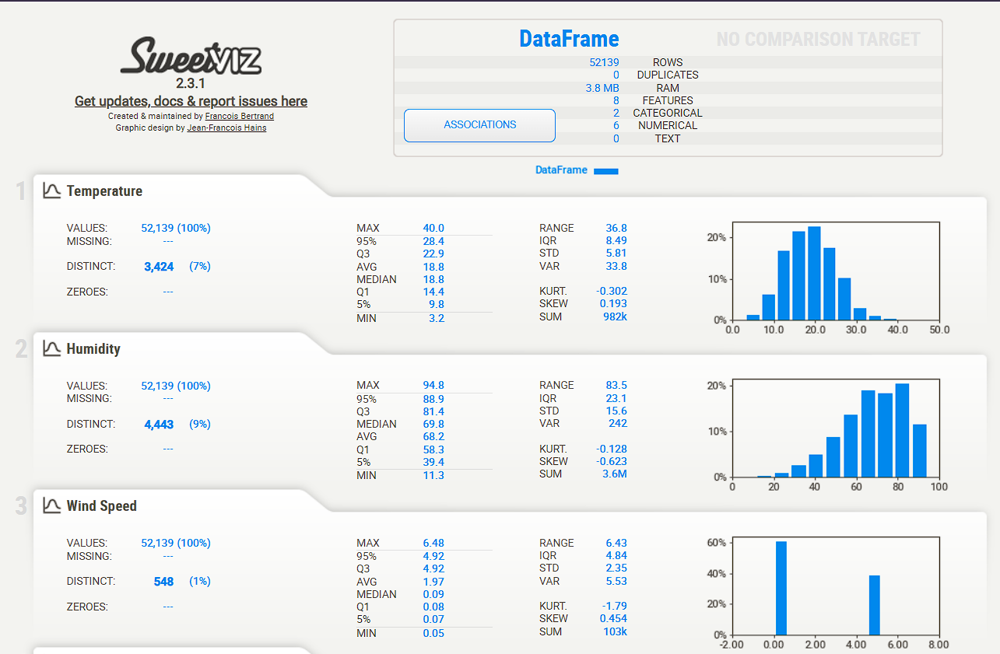

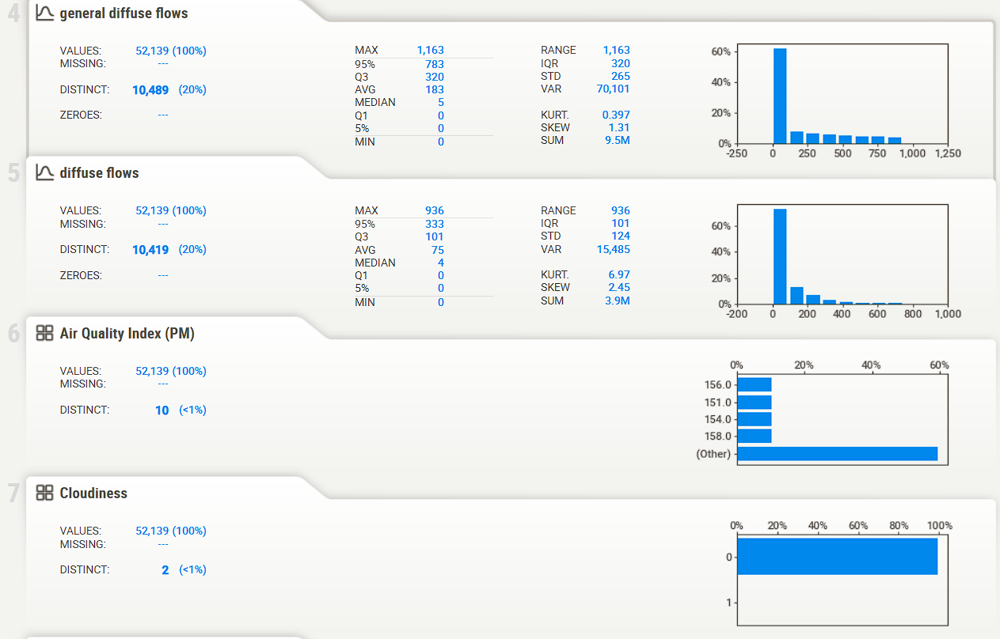

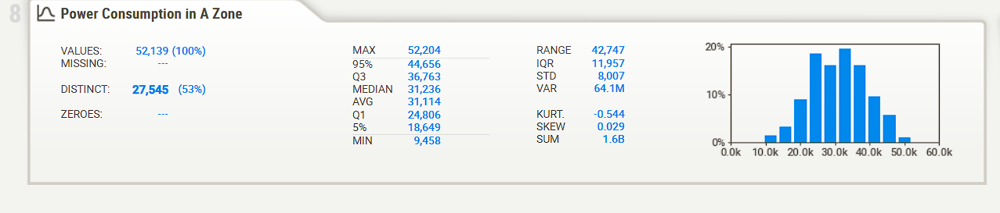

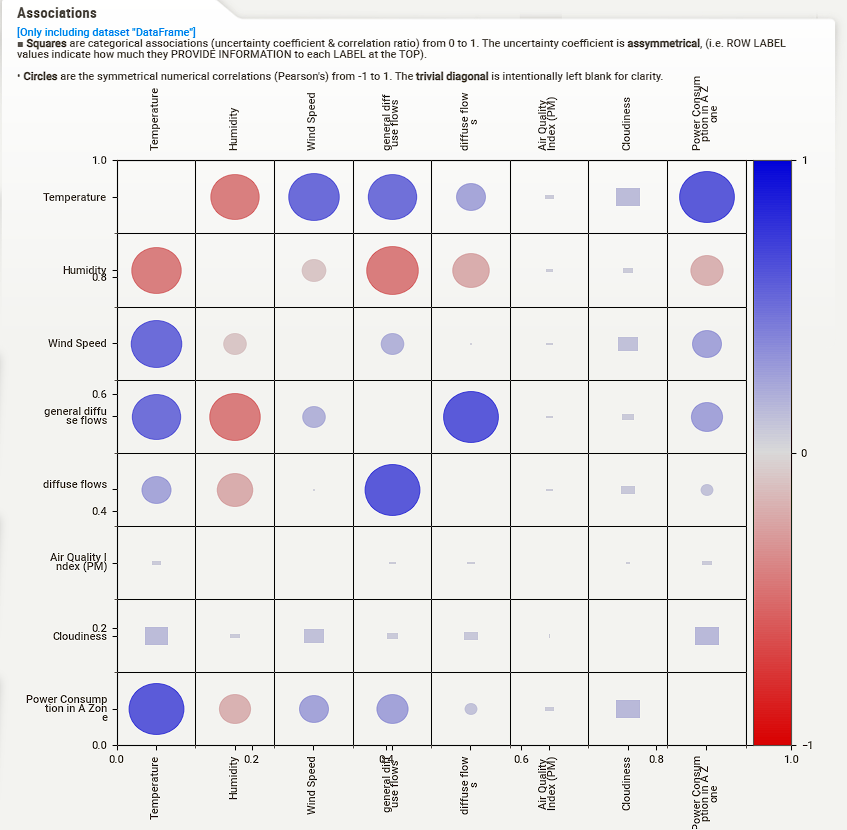

##### We also have packages like *AutoViz* and *dataprep* for automated data visulization tasks.
##### <u>Note:</u> These automation packages are good to just understand your data in a better way. However, to get the actual insights we should always 
##### stick to the manual approach as we get more control and can get more deeper insights.

### Univariate Analysis -  Analysis of each Individual feature.

#### Box Plots

In [42]:
# Let us first make the box plot for each feature. Since all our data is numeric we can directly proceed without any seggregation

#### Box plots gives the information about outliers and statistical distribution

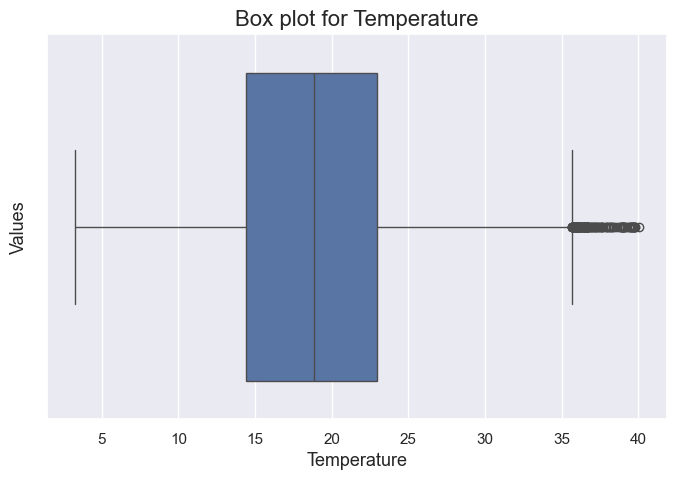

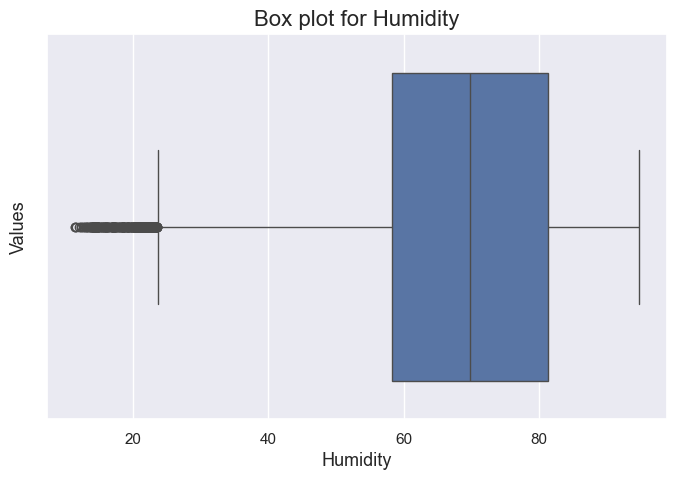

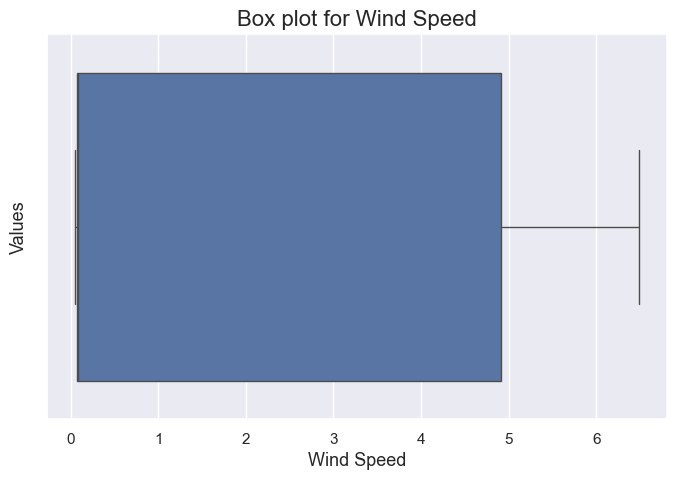

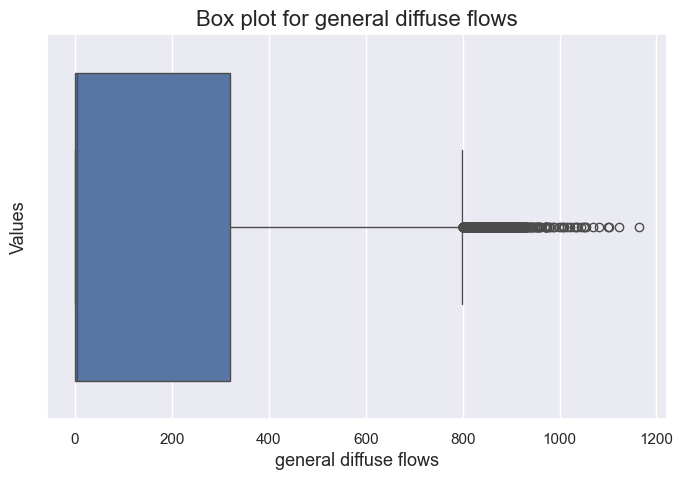

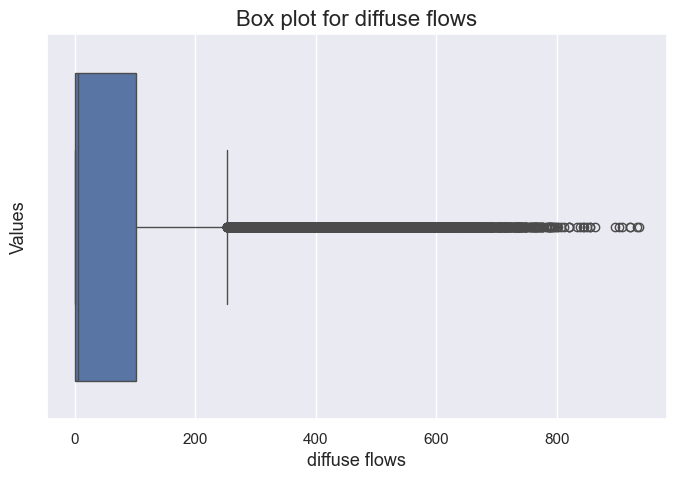

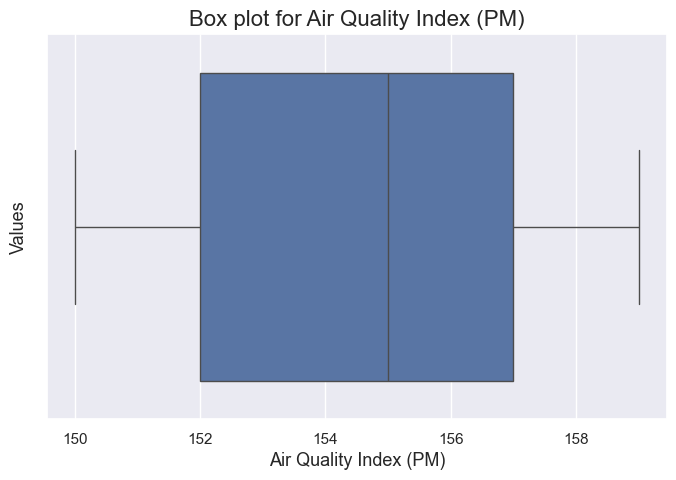

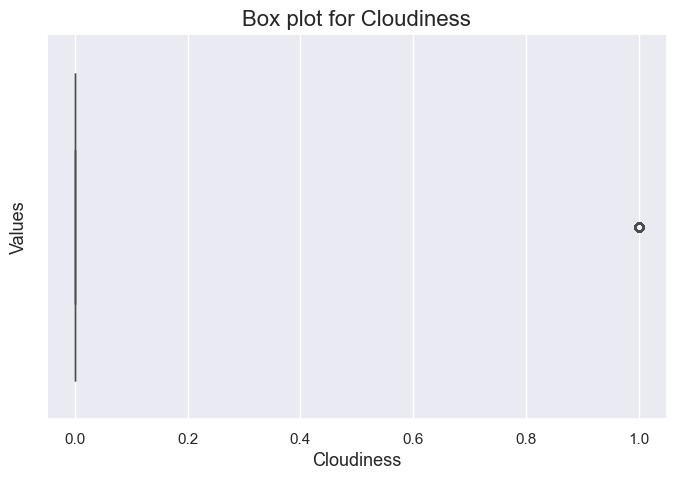

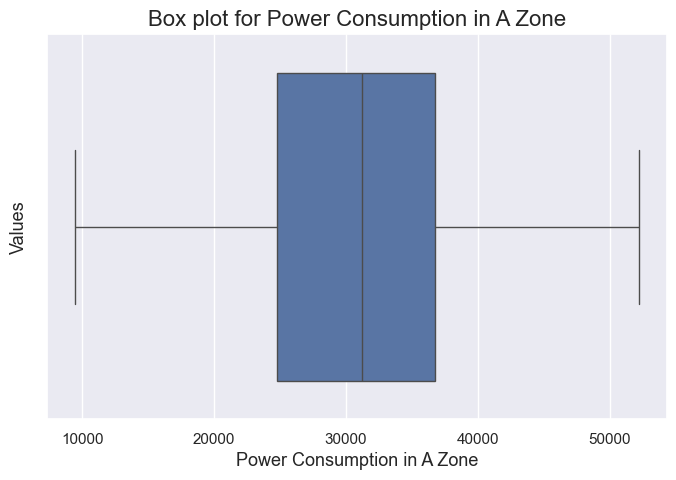

In [45]:
for column in df.columns:
    plt.figure(figsize = (8,5))
    sns.boxplot(data = df, x = column)
    plt.title(f'Box plot for {column}',fontdict = {'fontsize' : 16})
    plt.xlabel(column, fontdict = {'fontsize' : 13})
    plt.ylabel('Values', fontdict = {'fontsize' : 13})
    plt.show()

##### We can observe that the columns <u>Temperature</u>, <u>Humidity</u>, <u>General diffuse flows</u>, <u>Diffuse flows</u> have outliers.
##### The Cloudiness column has just two columns so there is no scope for outliers.

#### Displot (shows Data distribution)

In [46]:
# Let us now observe the distribution of all the features.

##### We should now exclude the <u>Cloudiness</u> column as its individual distibution will not give us any idea. we shall visualize that using some other visualization and with respect to some other features.

In [55]:
numerical_columns = [column for column in df.columns if column != 'Cloudiness']

In [56]:
numerical_columns

['Temperature',
 'Humidity',
 'Wind Speed',
 'general diffuse flows',
 'diffuse flows',
 'Air Quality Index (PM)',
 'Power Consumption in A Zone']

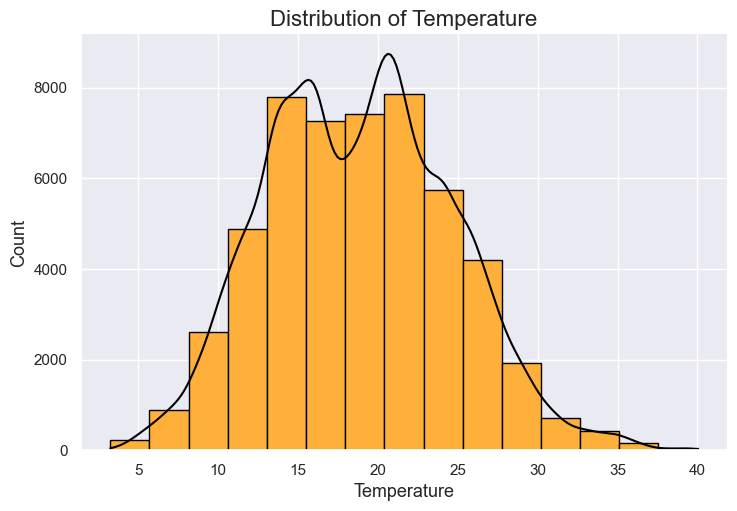

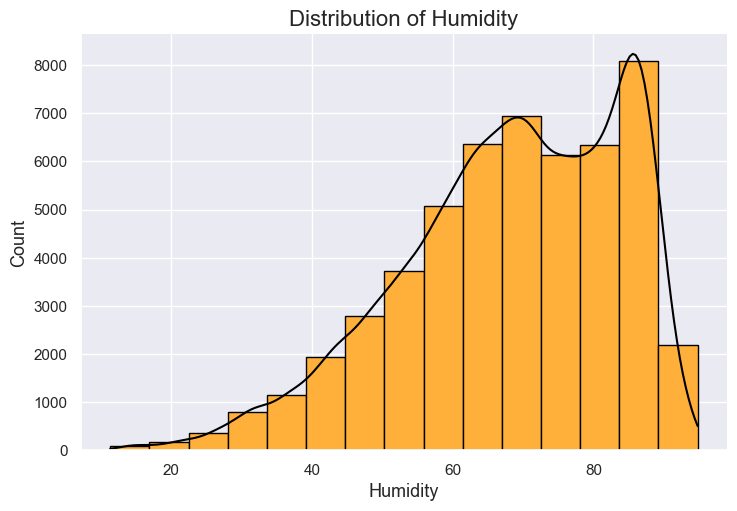

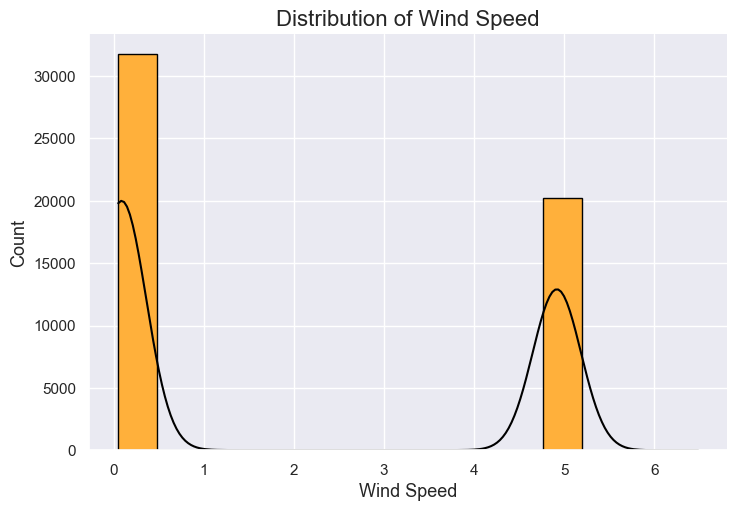

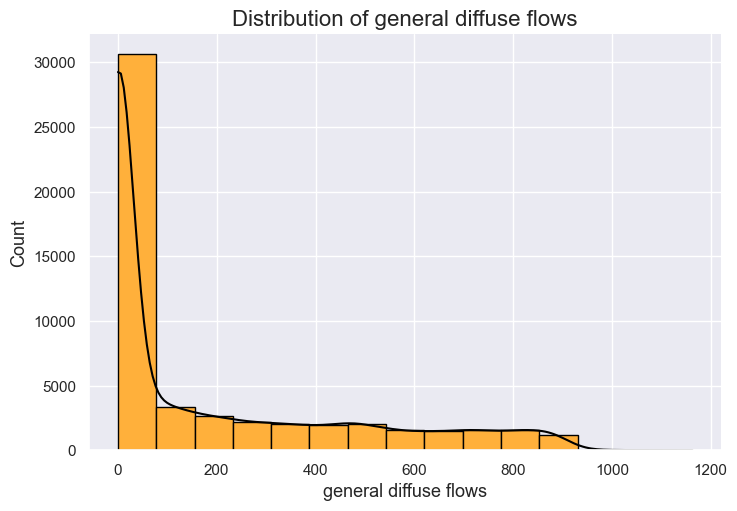

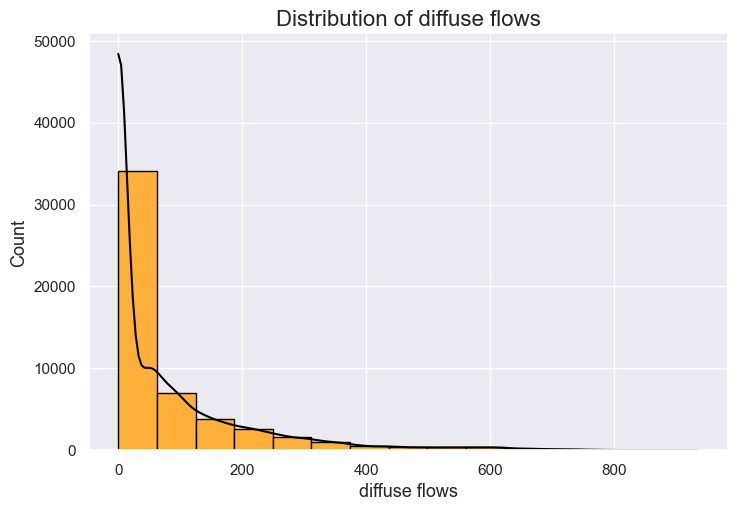

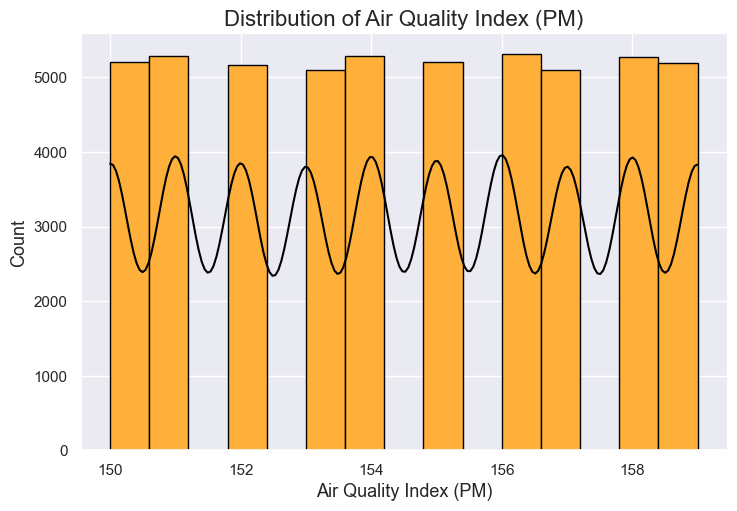

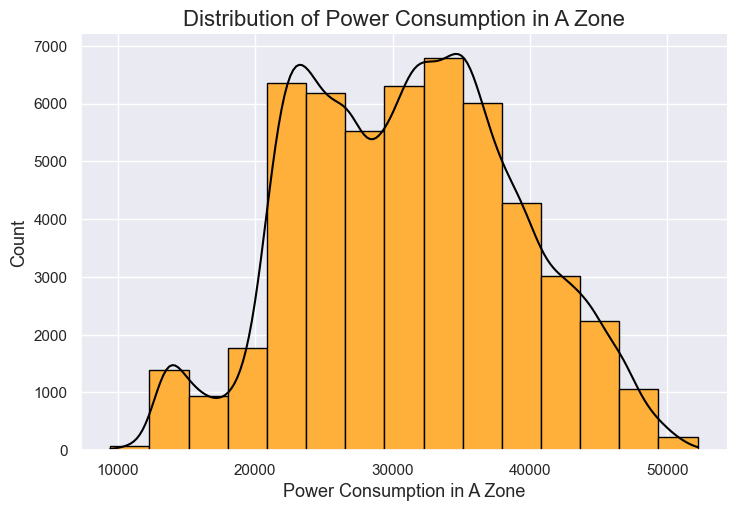

In [84]:
for column in numerical_columns:
    sns.displot(data = df, x = column, kde = True, bins = 15, color = 'black', edgecolor = 'black', facecolor = '#ffb03b', aspect = 1.5)
    # Creates a displot with kernel density estimate = True
    plt.title(f'Distribution of {column}',fontsize = 16)
    plt.xlabel(column, fontdict = {'fontsize' : 13})
    plt.ylabel('Count', fontdict = {'fontsize' : 13})
    plt.show()

##### We can see that sns.displot is not giving a very good idea of the distribution of <u>*Air Quality Index (PM) column*</u>.
##### Hence, we shall create a count plot for this feature. But, let us first visualize the Cloudiness column.

In [88]:
# Visualizing the Cloudiness column.

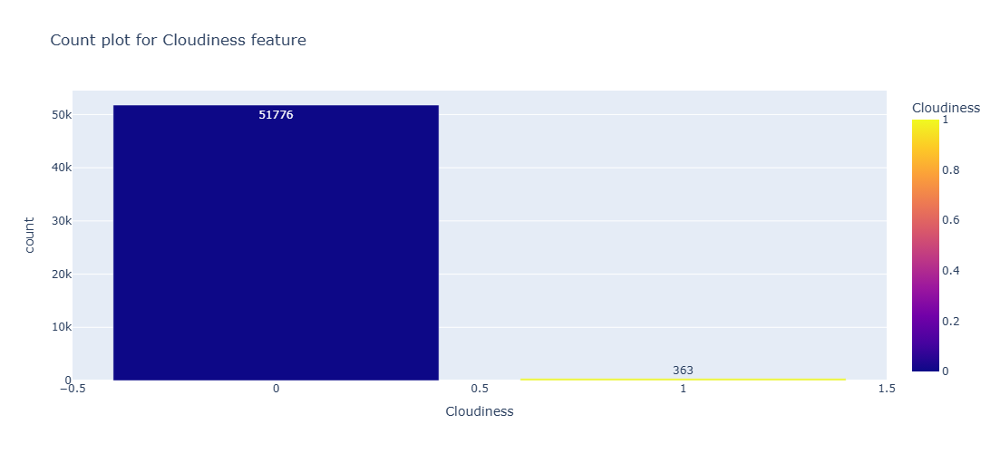

In [91]:
cloudiness_count = df['Cloudiness'].value_counts().reset_index() # Creating a data frame with value counts for Cloudiness column, so as to create a plotly bar chart.
fig = px.bar(data_frame = cloudiness_count,
             x = 'Cloudiness',
             y = 'count',
             text_auto = 'd',
             color = 'Cloudiness',
             text = 'count',
             title = 'Count plot for Cloudiness feature',
             height = 500,
             width = 1000)
fig.show()

##### We can see a significant difference between the counts where cloudiness = 0 and cloudiness = 1.

In [100]:
# Let us make on Count plot for 'Air Quality Index (PM)' feature as it has 10 unique values only and displot() might not provide 
# a good representation of its distribution.

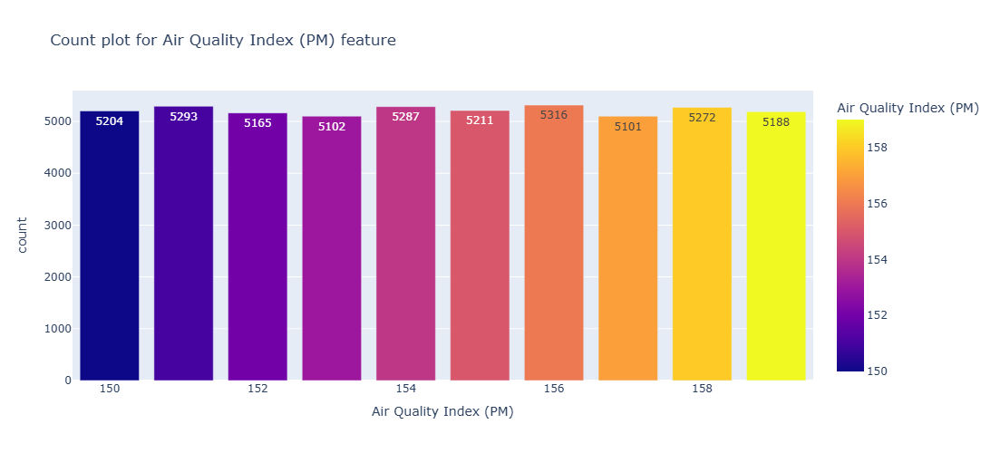

In [99]:
AQI_count = df['Air Quality Index (PM)'].value_counts().reset_index() # Creating a data frame with value counts for Cloudiness column, so as to create a plotly bar chart.
fig = px.bar(data_frame = AQI_count,
             x = 'Air Quality Index (PM)',
             y = 'count',
             text_auto = 'd',
             color = 'Air Quality Index (PM)',
             text = 'count',
             title = 'Count plot for Air Quality Index (PM) feature',
             height = 500,
             width = 1000)
fig.show()

### Bivariate Analysis - Analysis of any two features with each other.

#### Scatter Plots

#### Scatter plots show the relationship between two numerical variables.

In [109]:
# Here, since all our features are numerical let us straight away plot the scatter plots

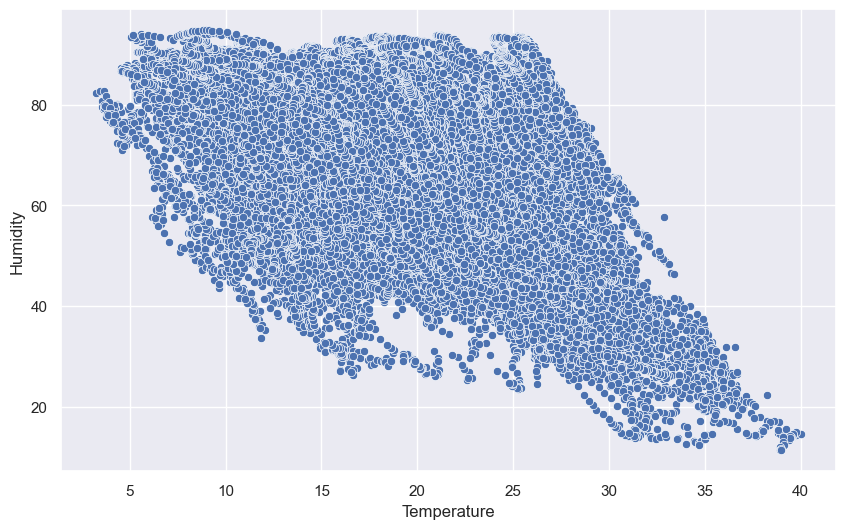

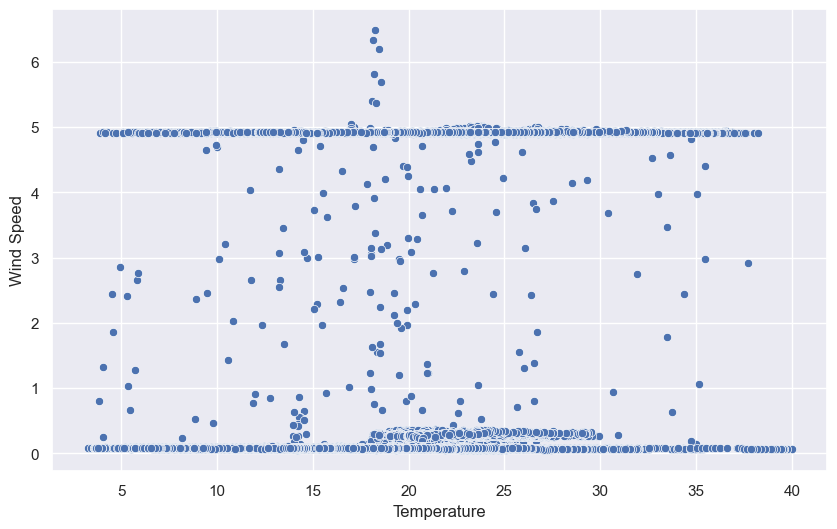

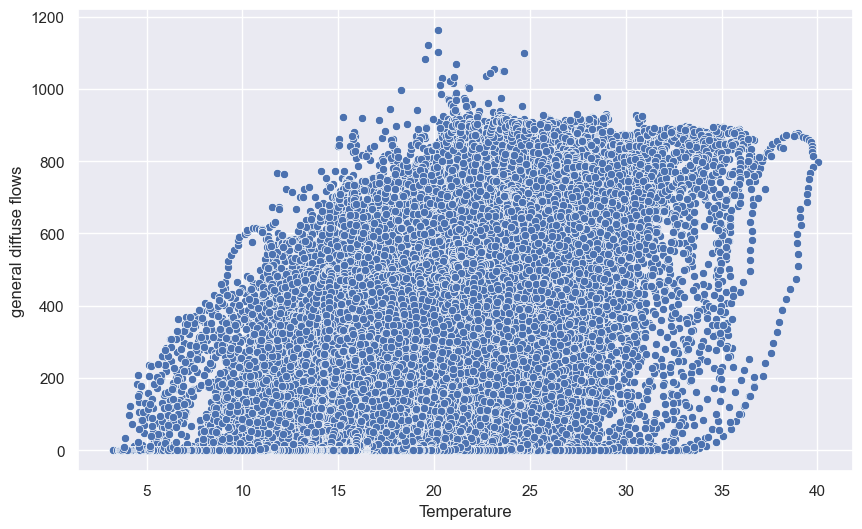

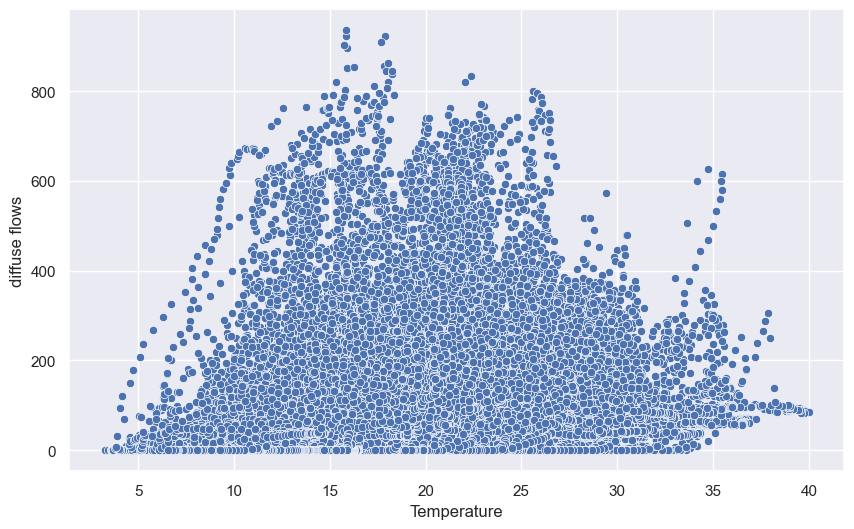

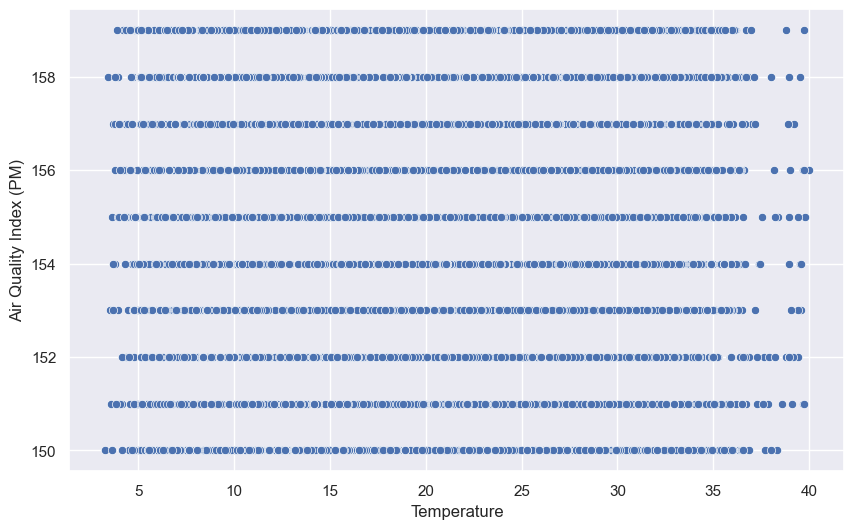

...

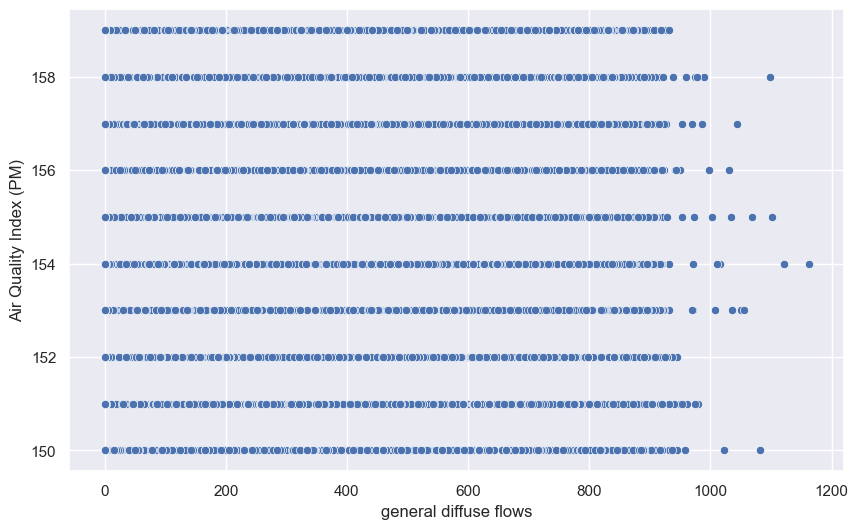

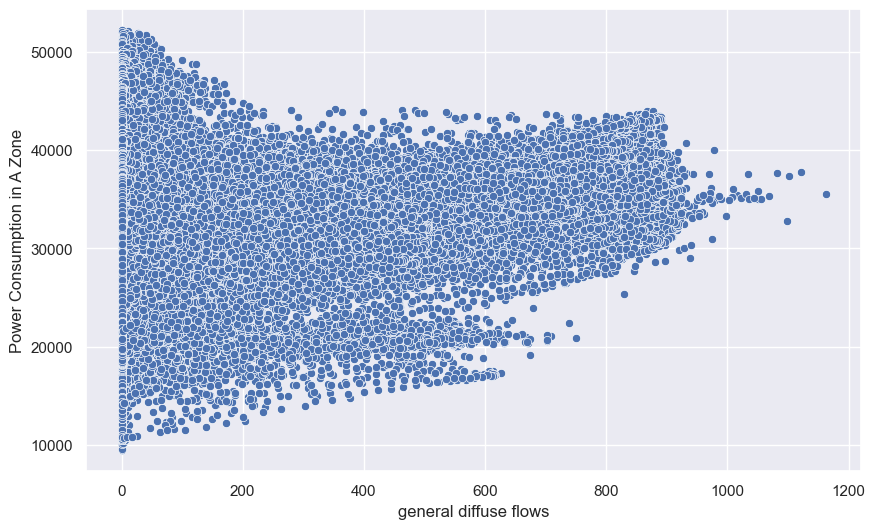

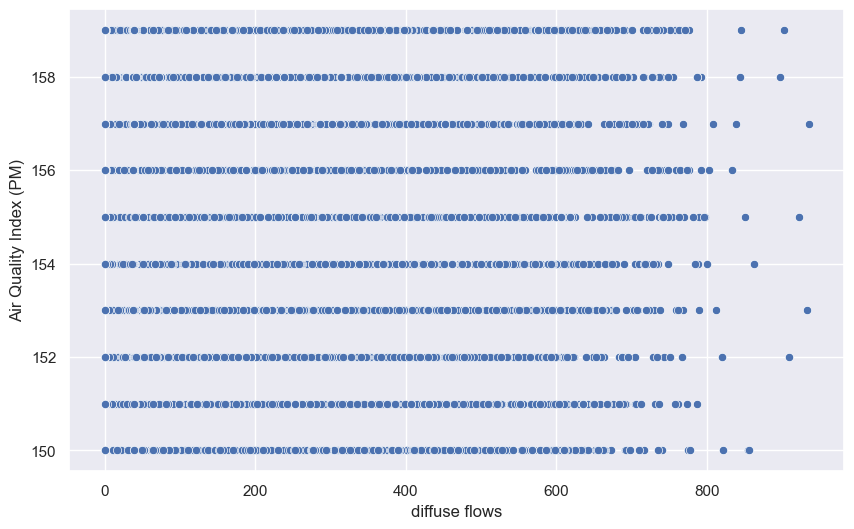

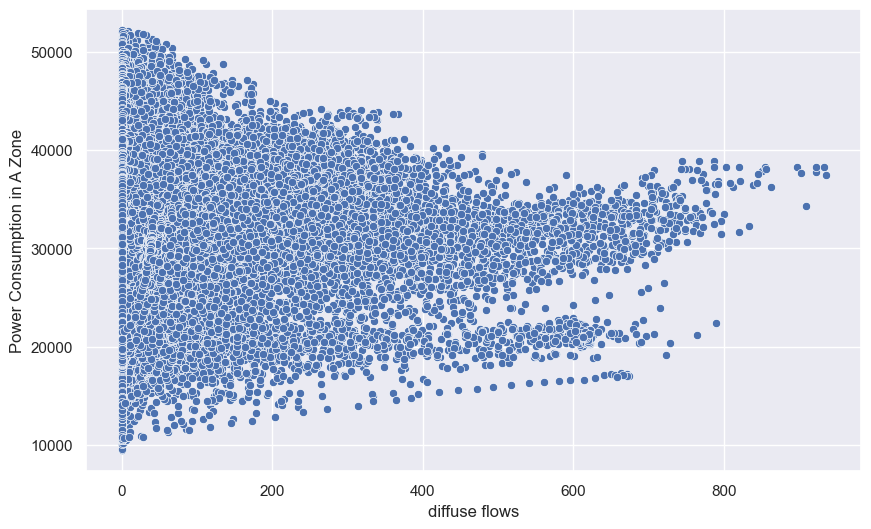

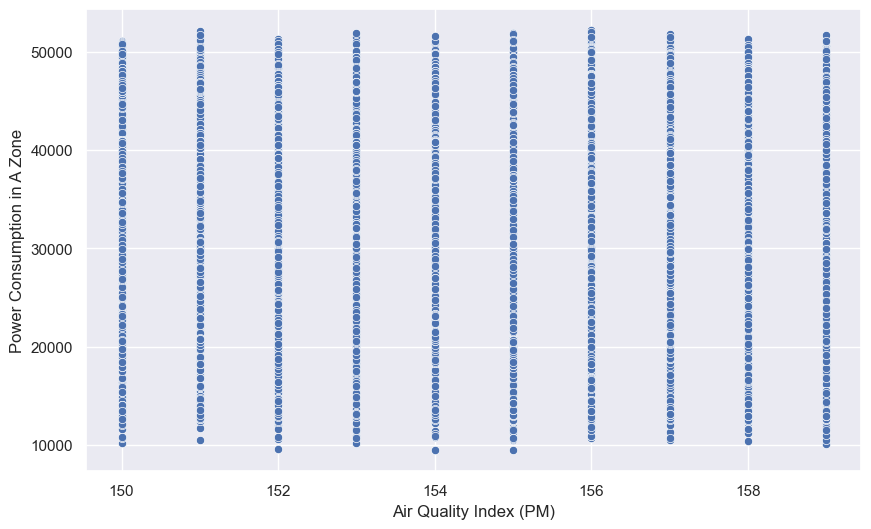

In [110]:
for i in range(len(numerical_columns)):
    for j in range(i+1, len(numerical_columns)): # Creates the scatter plot for each pair
        plt.figure(figsize = (10,6))
        sns.scatterplot(data = df, x = numerical_columns[i], y = numerical_columns[j])
        plt.show()

#### Looking at these scatter plots we are not able to get the exact insights of the correlation between our features.
#### We shall plot heatmaps and correlation matrix for that clarity.

In [111]:
# Lets us create a correlation matrix data frame first

In [112]:
df.corr() # Create a correlation matrix dataframe showing correlation of each feature with another including itself.

,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Air Quality Index (PM),Cloudiness,Power Consumption in A Zone
Temperature,1.000000,-0.459775,0.475712,0.460745,0.195344,-0.003047,-0.093471,0.558880
Humidity,-0.459775,1.000000,-0.135260,-0.467466,-0.256262,0.003738,0.021357,-0.229755
Wind Speed,0.475712,-0.135260,1.000000,0.133824,-0.001895,0.000955,-0.063660,0.203752
general diffuse flows,0.460745,-0.467466,0.133824,1.000000,0.565058,-0.001331,-0.023307,0.208860
diffuse flows,0.195344,-0.256262,-0.001895,0.565058,1.000000,-0.002161,-0.034063,0.060794
Air Quality Index (PM),-0.003047,0.003738,0.000955,-0.001331,-0.002161,1.000000,-0.001875,-0.001922
Cloudiness,-0.093471,0.021357,-0.063660,-0.023307,-0.034063,-0.001875,1.000000,-0.103444
Power Consumption in A Zone,0.558880,-0.229755,0.203752,0.208860,0.060794,-0.001922,-0.103444,1.000000


In [113]:
# Let us plot the Heatmap.

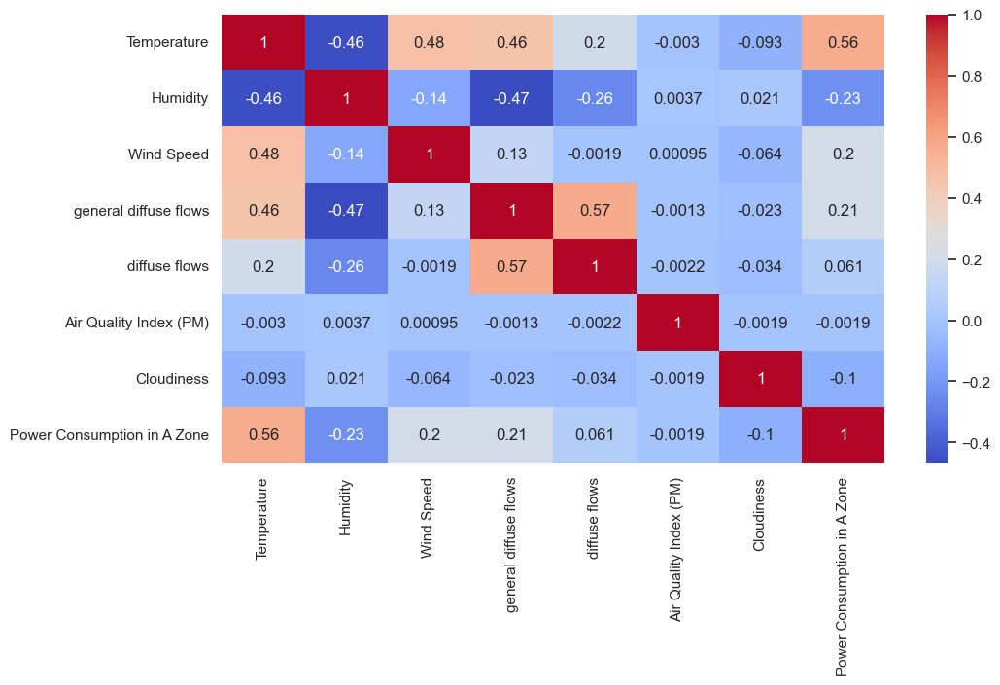

In [117]:
plt.figure(figsize = (11,6))
sns.heatmap(df.corr(), annot = True, cmap = 'coolwarm')
plt.show()

##### Displaying correlated features

As a general rule, 
* If correlation between features > **0.7** or <  **-0.7** --> Features are said to be **strongly correlated**.
* If correlation lies between **0.4** and **0.7** or **-0.4** and **-0.7** --> Features are said to be **weakly correlated**.
* If correlation is < **0.4** or > **-0.4** --> Features are not said to be **correlated** with each other.

In [119]:
# Keeping the track of correlation values using heatmap for each and every feature might look cumbersome. Hence, let us write a script to
# straight away display the correlated features (if any)

In [128]:
correlated_features = set() # To store just the unique pairs
for i in range(len(df.columns)):
    for j in range(len(df.columns)):
        if i < j:
            if np.abs(df.corr()[df.columns[i]][df.columns[j]]) > 0.7: # we take 0.7 as a general rule
                correlated_features.add((df.columns[i], df.columns[j]))
print(correlated_features)

set()


We have no two features that are strongly correlated. However, there is a moderate correlation between
**'Temperature'**, **'Power Consumption in A Zone'**
and
**'general diffuse flows'**, **'diffuse flows'** as seen from the Heatmap.
Since, **'Power Consumption in A Zone'** is our target feature, its correlation with Temperature suggest that is could be a good predictor for us!
Now, for **'general diffuse flows'** and  **'diffuse flows'** we should check for Multicollinearity by *VIF* method

##### Variance Inflation Factor (VIF) measures how much a feature is correlated with other feature in a dataset. As a general rule,
##### if VIF comes out to be in the range 1-2 we can say that there is no multicollinearity between features,
##### if VIF comes out to be in the range 2-5 we can say that there is a moderate mutlicollinearity b/w features,
##### if VIF comes out to be in the range 5-10 we can say that the features under obeservation have high multicollinearity

In [132]:
# Let us check the VIF for the features general diffuse flows' and 'diffuse flows'

In [171]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

test_features = df[['general diffuse flows', 'diffuse flows']]  # checking VIF for 'general diffuse flows' and 'diffuse flows'
vif_data = pd.DataFrame()
vif_data['Feature'] = test_features.columns
vif_data['VIF'] = [variance_inflation_factor(test_features.values, i) for i in range(test_features.shape[1])]
print(vif_data)

                 Feature       VIF
0  general diffuse flows  1.918215
1          diffuse flows  1.918215


##### We have found the VIF to be around 1.9, suggesting no multicollinearity between 'general diffuse flows' and 'diffuse flows'

In [133]:
# Lets visualize the relationship between 'Cloudiness' with all the features

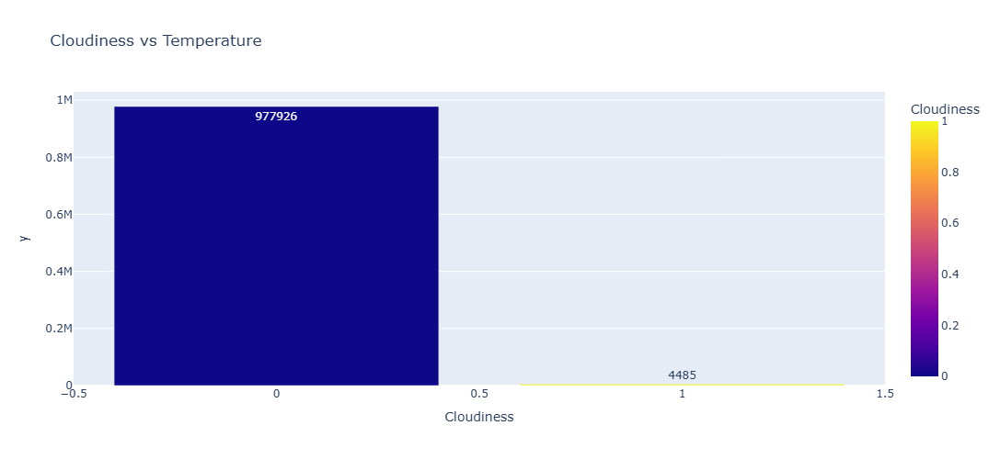

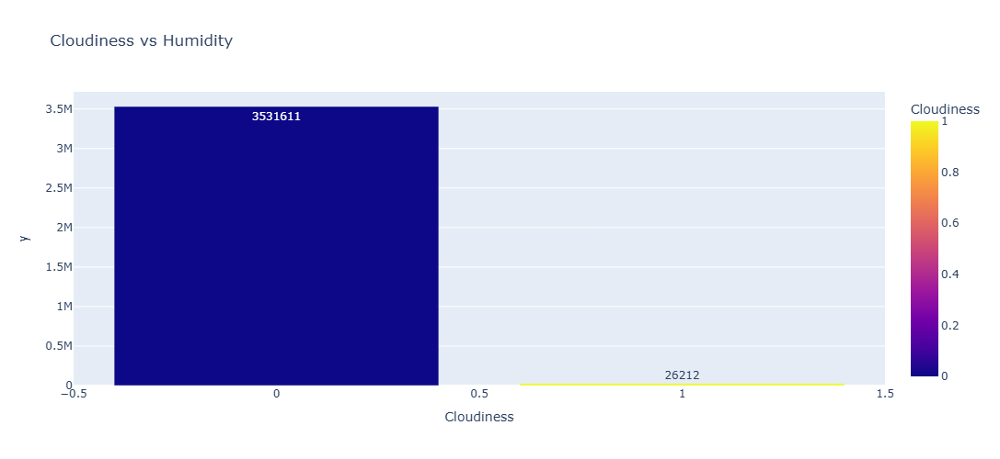

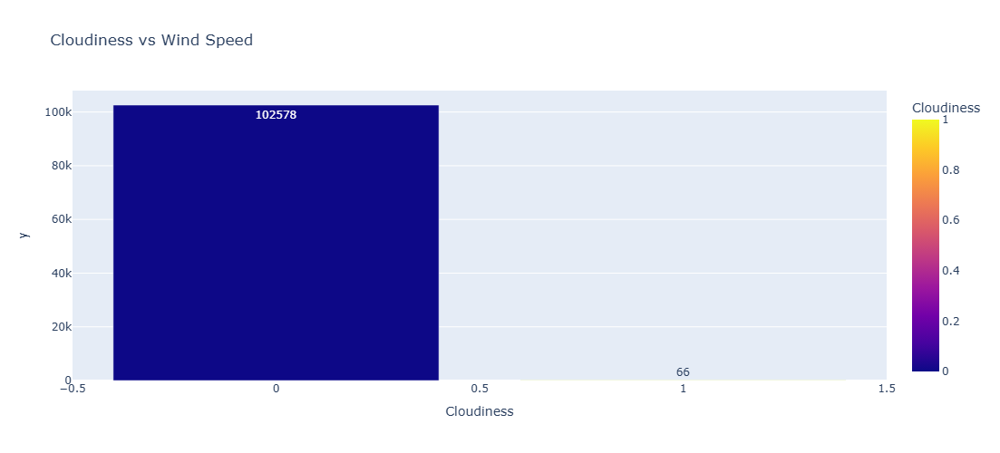

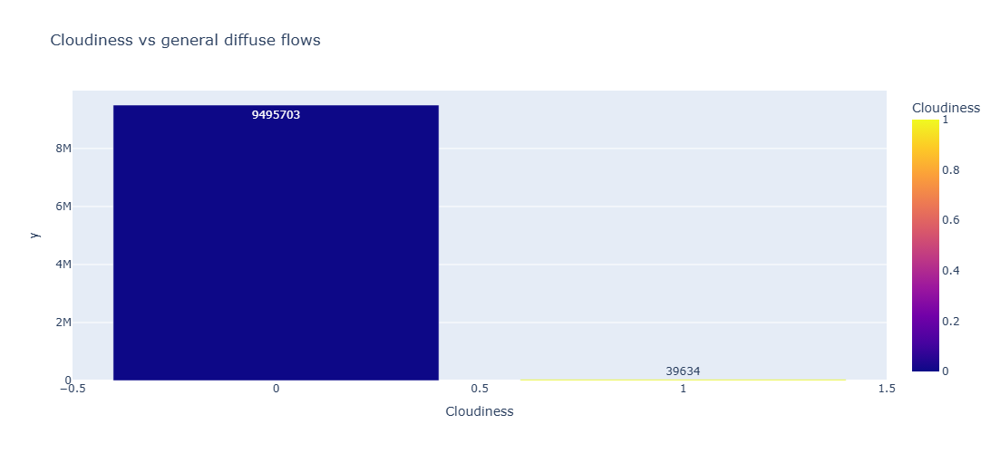

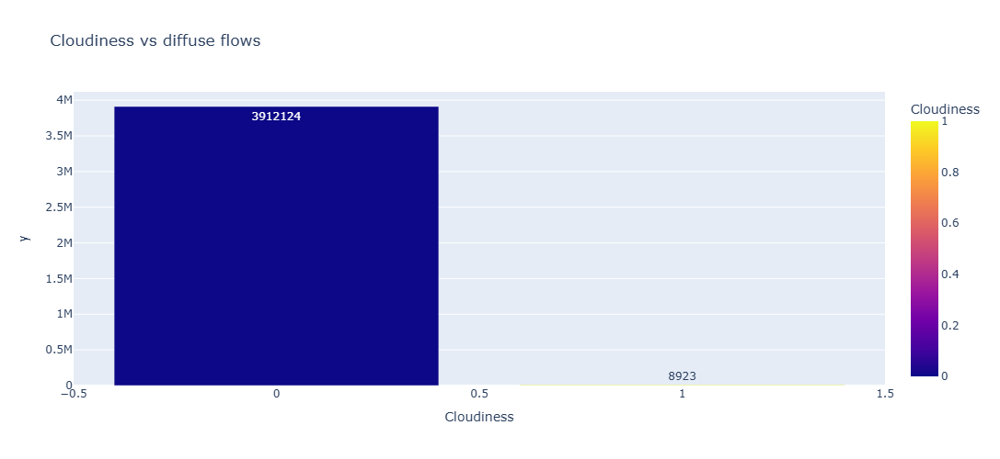

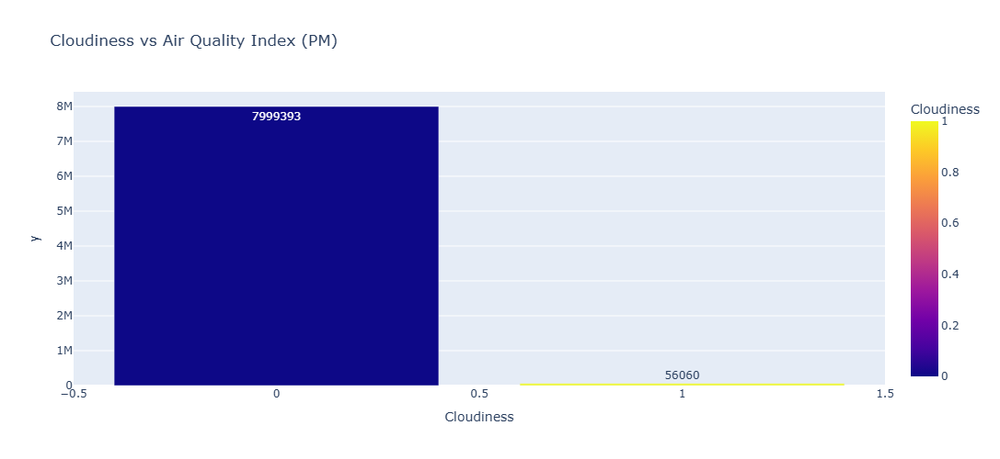

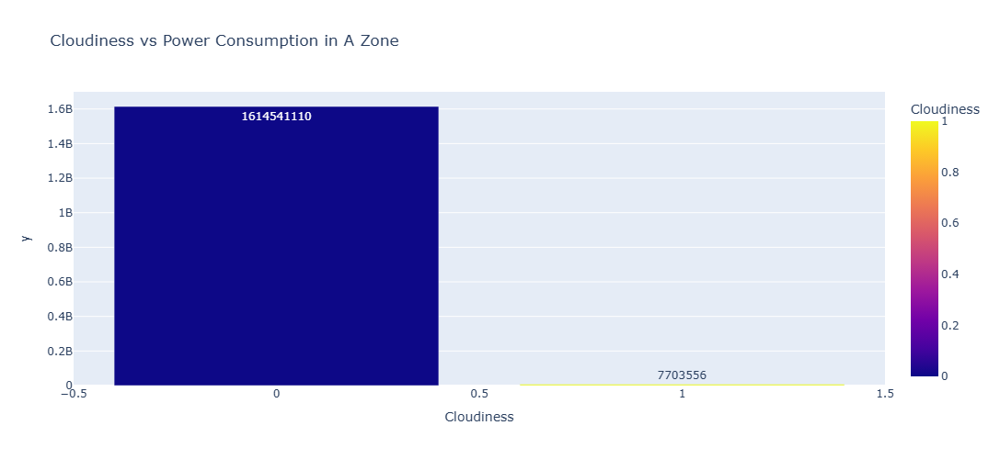

In [145]:
for columns in numerical_columns:
    df_test = df.groupby('Cloudiness').agg({columns : np.sum})
    # Creating a group by aggregation of all the features wrt to 'Cloudiness' column to create a plotly bar chart depicting count of each value.
    fig = px.bar(df_test, x = df_test.index, y = df_test.values.flatten(), text_auto = 'd', color = df_test.index,
                 text = df_test.values.flatten(), height = 500, width = 1000, title = f'Cloudiness vs {columns}')
    fig.show()

In [149]:
# Let us check the distribution using bar chart for each feature with our target feature 'Power Consumption in A Zone'. 

##### Now, since all our features are numeric with a great number of unique values. We should consider binning them if we
##### want to create a bar chart.

In [165]:
df.columns # displaying the columns of our data frame

Index(['Temperature', 'Humidity', 'Wind Speed', 'general diffuse flows',
       'diffuse flows', 'Air Quality Index (PM)', 'Cloudiness',
       'Power Consumption in A Zone'],
      dtype='object')

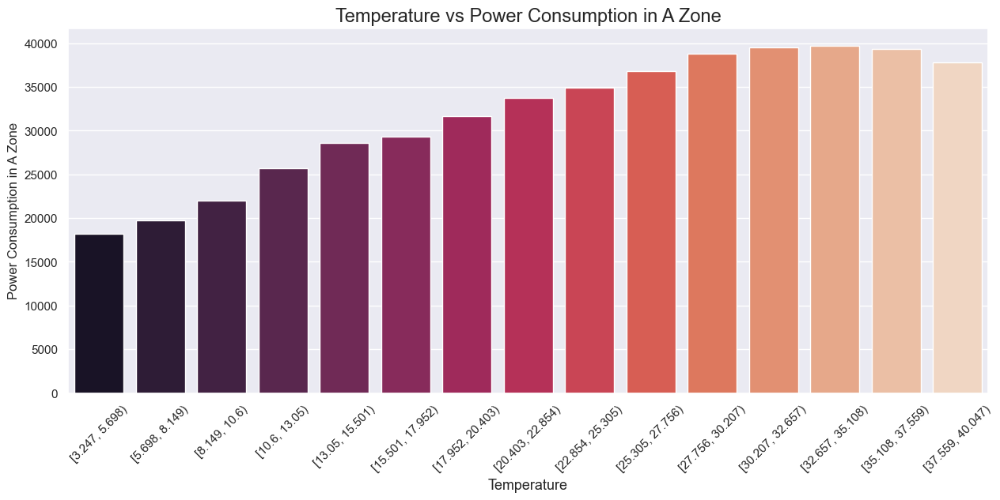

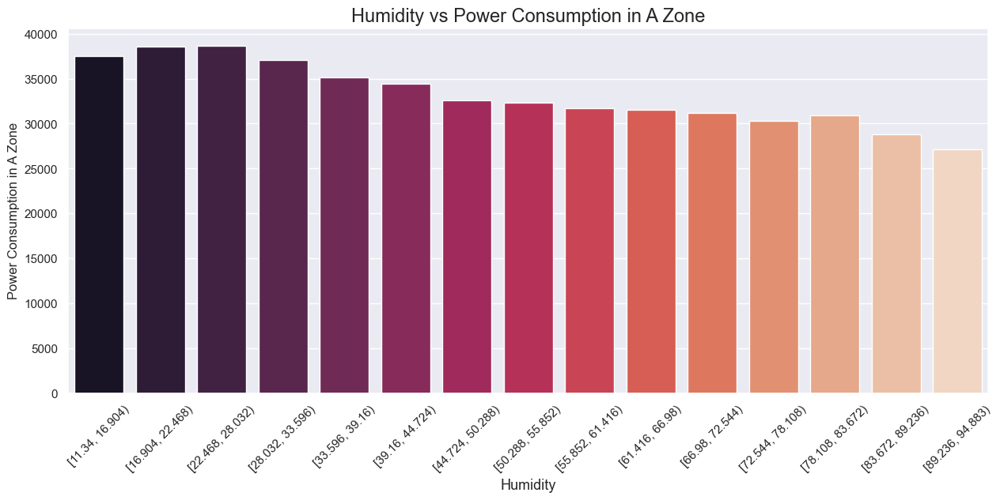

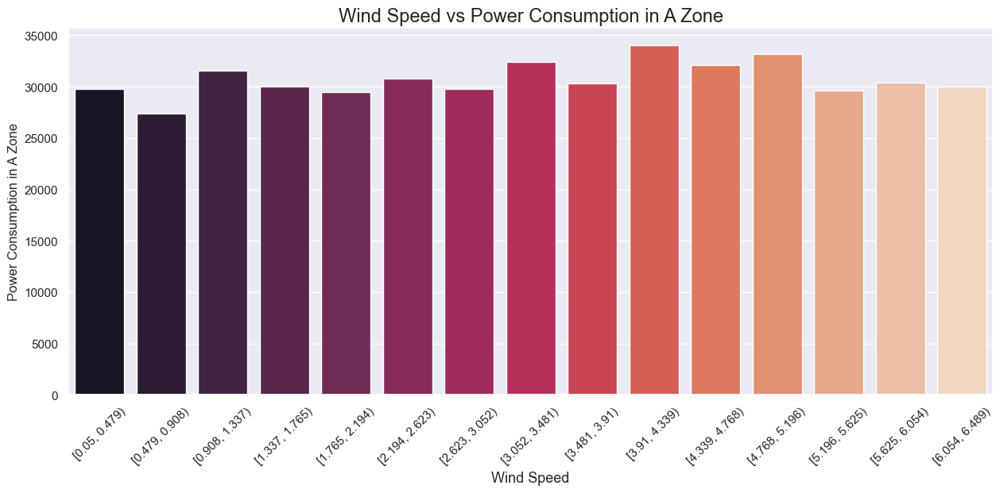

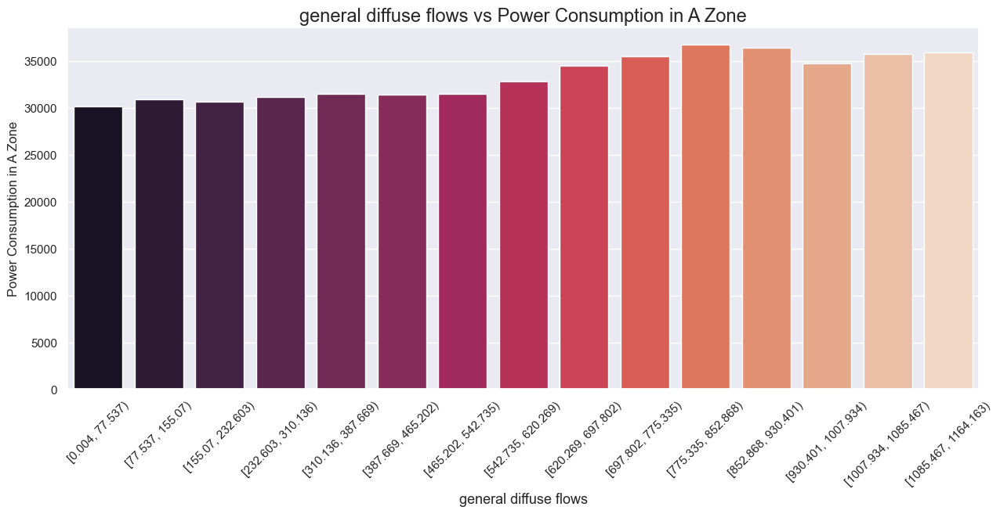

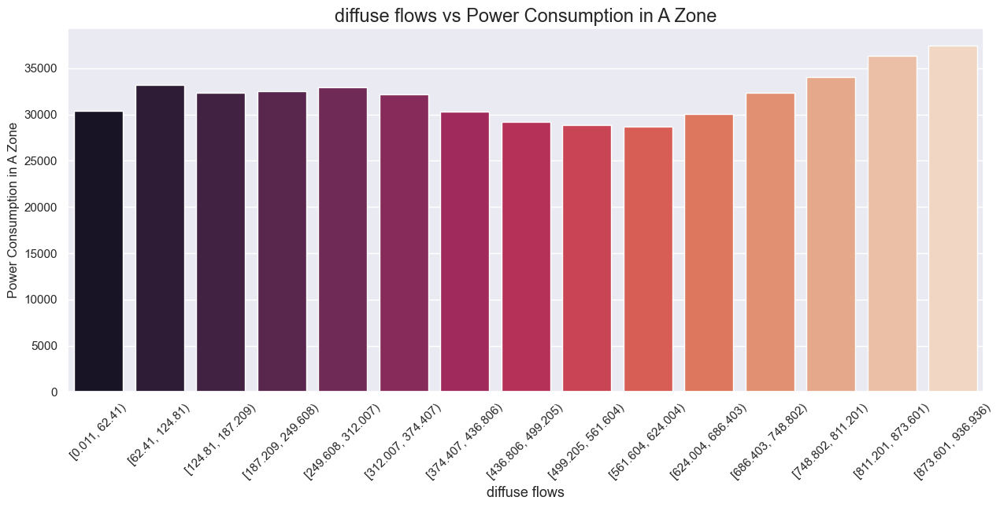

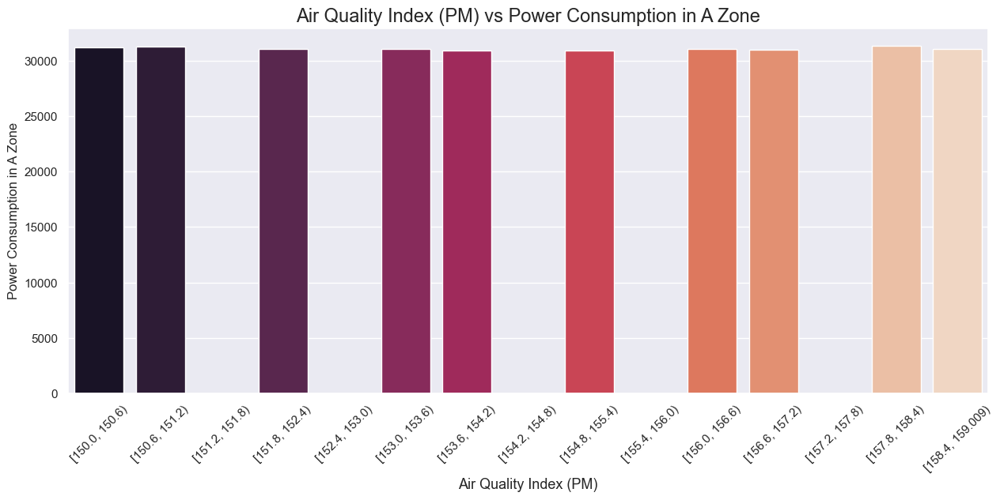

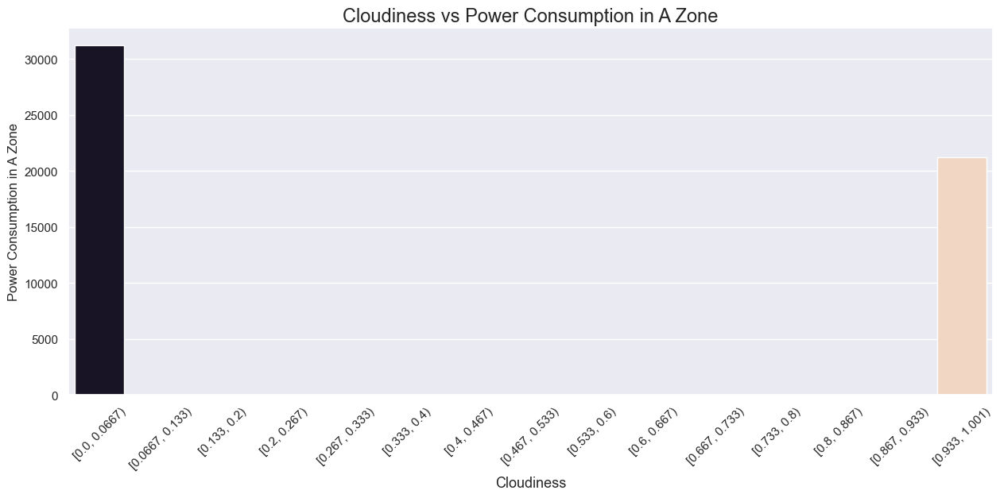

In [166]:
for column in df_test.columns[:-1]:  # Excluding our target column from the list
    plt.figure(figsize = (15,6))
    df_test = df.copy() # Creating a copy of our data with the name df_test, so that we dont modify our original data.
    df_test[column] = pd.cut(x = df_test[column], bins = 15, right = False) # Binning the data in 15 bins with rightmost point excluded
    df_grouped = df_test.groupby(column).agg({'Power Consumption in A Zone' : np.mean}).reset_index()
    # Creating a group by aggregation of our newly created bins with the mean values of our target feature i.e., 'Power Consumption in A Zone'
    sns.barplot(data = df_grouped, x = column, y = 'Power Consumption in A Zone', palette = 'rocket')
    plt.title(f'{column} vs Power Consumption in A Zone', fontsize = 17)
    plt.xticks(rotation = 45)
    plt.xlabel(column, fontsize = 13)
    plt.ylabel('Power Consumption in A Zone')
    plt.show()

### Statistical Analysis

#### We shall now conduct Statistical analysis to check the relationship between all our feature and target variable. The results of these
#### statistical tests might then help us improve our model later.

##### Since all our features are numeric, let us focus on finding the correlation and multicollinearity between and within our features. We have already
##### did the correlation analysis of each feature with each other. Now let us study the multicollinearity in detail.

In [172]:
test_columns = df.drop(columns=['Power Consumption in A Zone'])  # Remove target variable

vif_data = pd.DataFrame()
vif_data['Feature'] = test_columns.columns
vif_data['VIF'] = [variance_inflation_factor(test_columns.values, i) for i in range(test_columns.shape[1])]

print(vif_data)

                  Feature        VIF
0             Temperature  20.747576
1                Humidity  28.380003
2              Wind Speed   2.245475
3   general diffuse flows   2.882832
4           diffuse flows   2.031494
5  Air Quality Index (PM)  58.438417
6              Cloudiness   1.018208


##### By the general rule, that we have already seen, we can find that <u>Temperature</u>, <u>Humididty</u> and <u>Air Quality Index (PM)</u> posses multicollinearity with other features.

#### Now, lets test whether each feature significantly impacts the target variable. For this we would be conducting
* #### <u>z-test</u> --> since we have large number of samples. it check if a given feature has significant impact on target feature.
* #### <u>Anova test</u> --> check if two or more features are significantly different.
##### We use the concept of p_value here, for both the test, we calculate the p_value and z-statistic for z-test and F-statistic for Anova test.
##### As a general rule, if our p_value comes out to be > 0.05 the feature does not significantly impacts the target feature. And if p_value comes out to be < 0.05, the feature significantly impact the target feature.

#### Z-Test

In [181]:
from statsmodels.stats.weightstats import ztest
z_test_results = {}

for column in df.columns[:-1]:  # Excluding the target variable
    z_test, p_value = ztest(df[column], df['Power Consumption in A Zone'])
    z_test_results[column] = {'z_test' : z_test, 'p_value' : p_value}

pd.DataFrame(z_test_results)

,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Air Quality Index (PM),Cloudiness
z_test,-886.757062,-885.346988,-887.238451,-881.597383,-885.043119,-882.888604,-887.294432
p_value,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


##### <u>Observation:</u> since for all features the p_value < 0.05, we can say that all our features sgnificantly impacts the target feature.

#### Anova

In [183]:
from scipy.stats import f_oneway
anova_results = {}

for column in df.columns[:-1]:
    f_statistics, p_value = f_oneway(df[column], df['Power Consumption in A Zone'])
    anova_results[column] = {'f_statistic' : f_statistics, 'p_value' : p_value}

pd.DataFrame(anova_results)

,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Air Quality Index (PM),Cloudiness
f_statistic,786338.08741,783839.288501,787192.068201,777213.944895,783301.322231,779492.287234,787291.408342
p_value,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


##### <u>Observation:</u> Since, p_value for all features is < 0.05, we can say that all features have statistically significant difference in means when compared with target feature.

### Multivariate Analysis - Analysis of more than two features with each other.

##### We shall analyze all our feature with respect to our target feature which is **'Power Consumption in A Zone'**. Also, we shall show the distribution
##### with respect to other two features which are **'Cloudiness'** and **'Air Quality Index (PM)'** as these features have the least number of unique numerical
##### values and thus can be used as a group to distribute the visualization further

In [191]:
# Let us create the desired list of columns excluding our target feature 'Power Consumption in A Zone' and other two features 
# 'Cloudiness' and 'Air Quality Index (PM)' to create the Multivariate analysis.

In [192]:
target_features = [column for column in df.columns if column not in ['Power Consumption in A Zone', 'Cloudiness', 'Air Quality Index (PM)']]
target_features

['Temperature',
 'Humidity',
 'Wind Speed',
 'general diffuse flows',
 'diffuse flows']

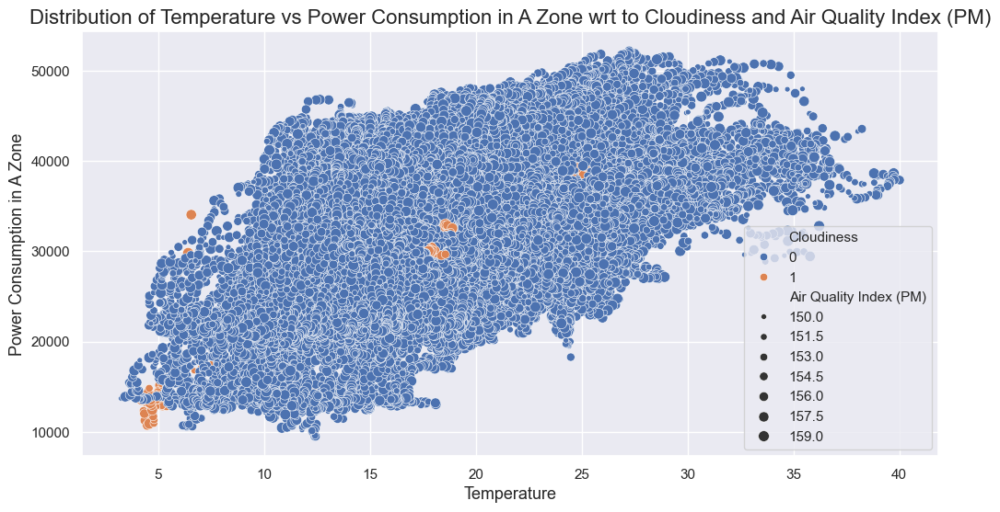

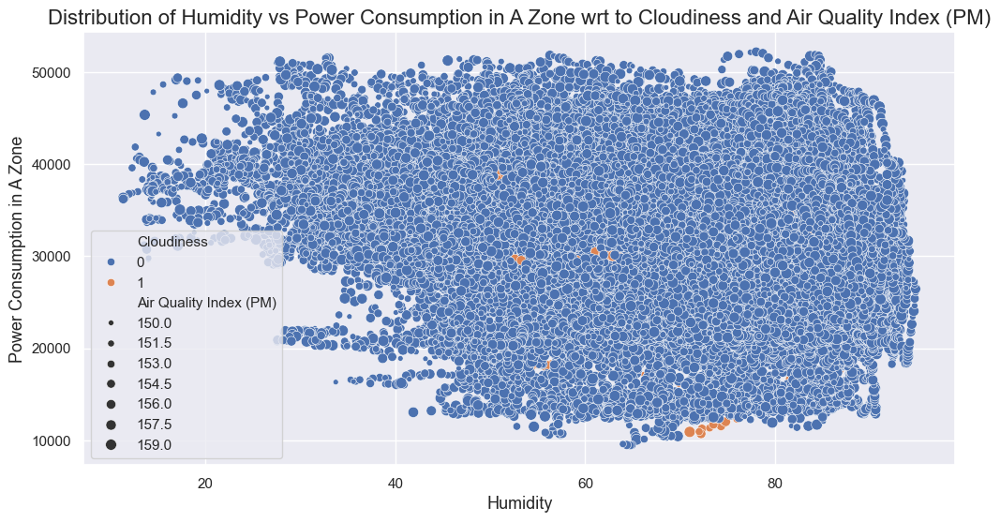

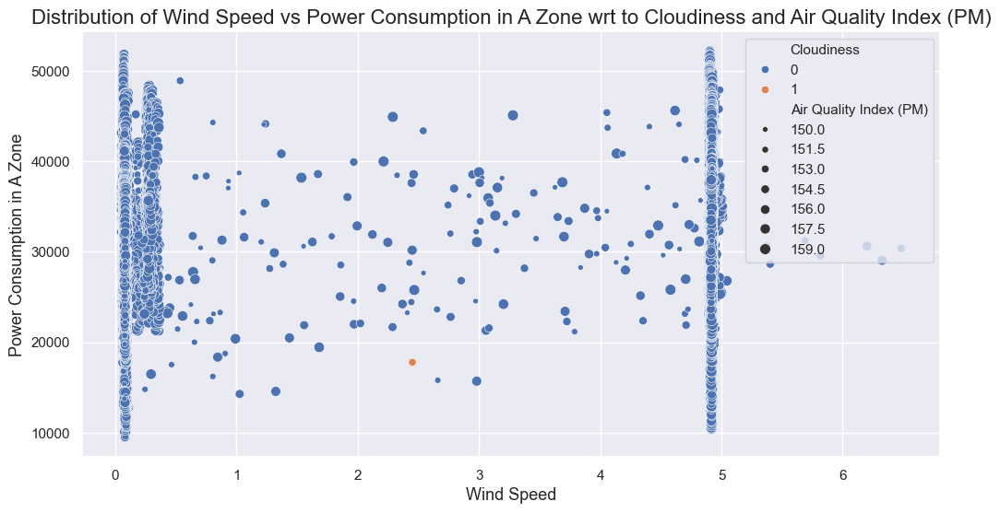

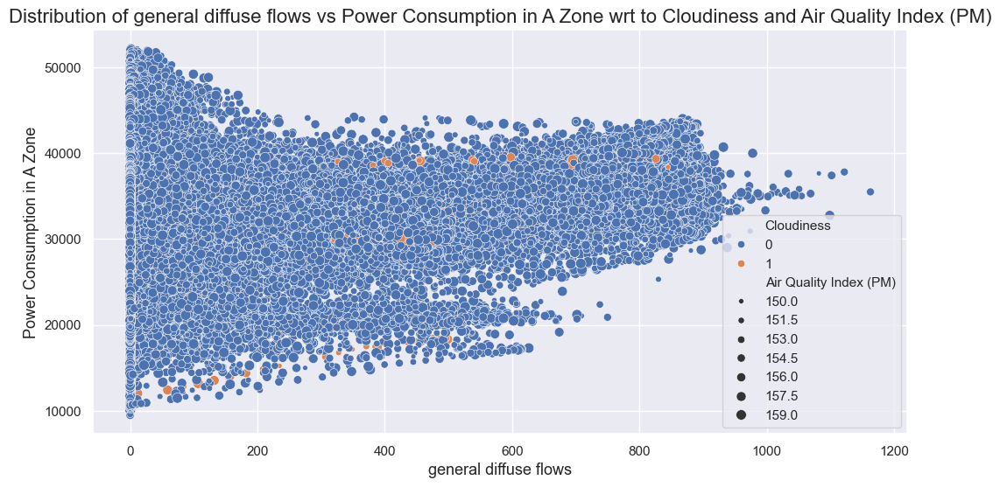

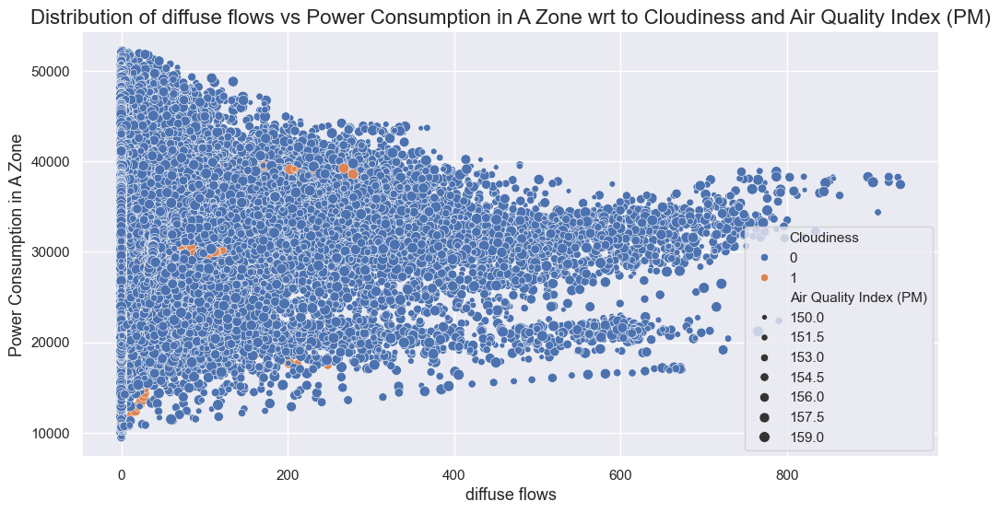

In [195]:
for column in target_features:
    plt.figure(figsize = (12,6))
    sns.scatterplot(data = df, x = column, y = 'Power Consumption in A Zone', hue = 'Cloudiness', size = 'Air Quality Index (PM)')
    plt.title(f'Distribution of {column} vs Power Consumption in A Zone wrt to Cloudiness and Air Quality Index (PM)', fontsize = 16)
    plt.xlabel(column, fontsize = 13)
    plt.ylabel('Power Consumption in A Zone', fontsize = 13)
    plt.show()

##### Let us also create a pair plot for the whole data with respect to **'Air Quality Index (PM)'** feature as this is our only category like feature apart
##### from **Cloudiness** for which there is a severe class imbalance. So it would not be a good idea to use that.

##### A pair plot shows the relationship of all the features with each other using scatter plots. and distribution of individual featues using KDE plots.

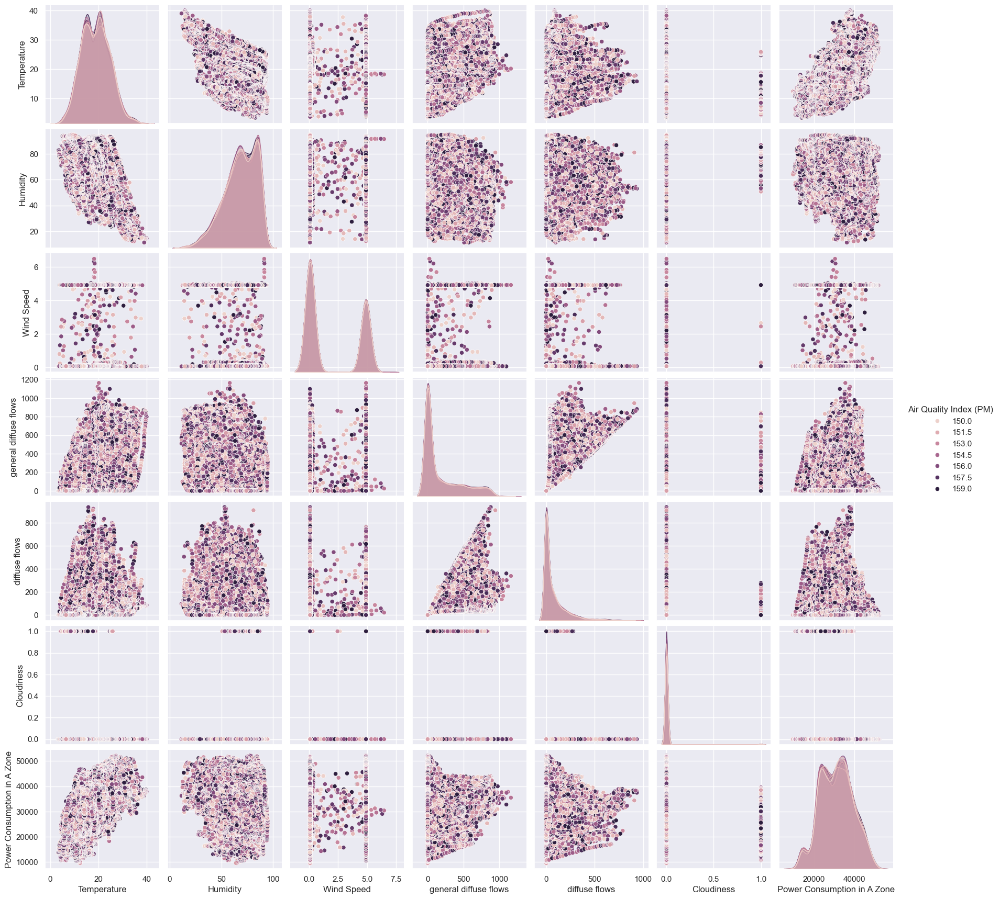

In [196]:
sns.pairplot(data = df, hue = 'Air Quality Index (PM)') # plotting scatter graphs for all the features with each other wrt 'Air Quality Index (PM)'
plt.show()

In [197]:
df.head()

,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Air Quality Index (PM),Cloudiness,Power Consumption in A Zone
0,6.559,73.8,0.083,0.051,0.119,158.0,1,34055.69620
1,6.414,74.5,0.083,0.070,0.085,159.0,1,29814.68354
2,6.313,74.5,0.080,0.062,0.100,151.0,1,29128.10127
3,6.121,75.0,0.083,0.091,0.096,151.0,1,28228.86076
4,5.921,75.7,0.081,0.048,0.085,154.0,1,27335.69620


### Model Building

#### First, let us create a baseline model without outlier detection and feature scaling. Let us proceed with the Linear Regression model for this purpose.

In [198]:
# Seggregating the data into x and y

In [207]:
x = df[df.columns[:-1]] # Taking all the features except our target feature 'Power Consumption in A Zone'
y = df[df.columns[-1]] # Taking just the target feature 'Power Consumption in A Zone'

In [208]:
# Splitting the data into Train and Test
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.25, random_state = 15) # Taking 25% of the samples as test data along with a 
                                                                                               # random state to store the samples.

In [211]:
# Training a baseline Linear Regression Model
linear_regression = LinearRegression() # creating an object of Linear Rgeression Model
model_lr_baseline = linear_regression.fit(x_train, y_train) # Training the model on our train data.
y_pred = model_lr_baseline.predict(x_test) # Making prediction on testing data.

# Model Evaluation
mse_baseline = mean_squared_error(y_test, y_pred) # mean squared error
rmse_baseline = np.sqrt(mse_baseline) # root mean squared error
r_score_baseline = r2_score(y_test, y_pred) # R2 score

# Printing the results
print('MSE_baseline :',mse_baseline)
print('RMSE baseline: ',rmse_baseline)
print('R2_score_baseline :',r_score_baseline)

MSE_baseline : 43451661.35127633
RMSE baseline:  6591.787417027064
R2_score_baseline : 0.32990663964916134


##### Our baseline model is able to explain only 33% of the variance

##### Let us now dive into Outlier Detection

In [212]:
# We shall create a function to detect outliers in a feature

In [232]:
def outlier_detector(column, data):  # Fucntion that takes in a column and return outliers
    q1 = data[column].quantile(0.25)  # q1 stores the value of first quantile
    q3 = data[column].quantile(0.75)  # q3 stored the values of third quantile
    iqr = q3 - q1  # iqr stores the inter-quartile range
    lb = q1 - 1.5*iqr  # lower bound, beyond which a point is generally considered as on outlier is stored in the variable lb
    ub = q3 + 1.5*iqr  # upper bound, beyond which a point is generally considered as on outlier is stored in the variable ub
    outliers = [i for i in data[column] if i > ub or i < lb]  # outliers detected are stored in a list
    if outliers:
        return outliers, len(outliers)  # if outliers are detected, they are displayed along with their total count.
    else:
        return 'No Outliers Detected'

In [219]:
# Lets display the outliers for each feature using our created function

In [233]:
for column in df.columns:
    outliers = outlier_detector(column, df)
    print(column)
    print(outliers)
    print()

Temperature
([35.78, 36.21, 36.37, 36.69, 36.59, 36.46, 36.16, 36.01, 35.68, 35.88, 35.68, 35.97, 36.37, 36.54, 36.65, 36.84, 37.01, 36.88, 36.73, 37.26, 36.65, 35.84, 35.78, 35.92, 35.85, 35.92, 35.83, 36.2, 36.04, 36.02, 36.13, 36.33, 36.54, 36.42, 36.45, 36.42, 36.49, 36.67, 36.43, 36.54, 36.88, 36.64, 36.57, 36.49, 36.57, 36.57, 36.51, 36.51, 36.51, 36.12, 35.98, 35.82, 35.96, 36.27, 36.62, 37.13, 37.17, 37.38, 37.52, 37.63, 37.9, 38.23, 38.34, 38.81, 38.98, 38.95, 38.8, 39.24, 39.41, 39.55, 39.67, 39.73, 39.74, 39.7, 39.78, 40.01, 39.76, 39.6, 39.59, 39.51, 39.44, 39.44, 39.11, 39.08, 39.15, 38.94, 38.93, 38.97, 38.99, 38.9, 38.59, 38.39, 38.17, 37.99, 37.88, 37.7, 37.6, 37.28, 37.16, 36.7, 36.45, 36.19, 36.0, 35.76, 35.92, 36.1, 36.68, 36.71, 36.49, 36.25, 35.93, 35.66, 36.13, 36.4, 36.96, 37.42, 37.56, 38.03, 38.23, 36.37, 35.7, 35.73, 36.04, 36.04, 35.92, 35.86, 35.94, 35.98, 35.99, 35.92, 35.94, 35.81, 35.86, 35.95, 35.98, 35.89, 35.81, 35.94, 35.89, 35.66], 140)

Humidity
([2

##### We can observe that the features **Temperature**, **Humidity**, **General Diffuse Flows**, **Diffuse flows** contain outliers.

##### **<u>Note:</u>** The feature **'Cloudiness'** is our categorical variable with just 2 values 0 and 1 and hence, outlier treatment will not make sense.

#### Now, let us see the impact of outliers and pre-processing on our baseline model.

##### *As a general rule, if our data contains outliers, we **Normalize** our data or use **Min Max Scaler** to scaler our data. While, if we have data* 
##### *without outliers, we **Standardize** our data our use **Standard scaler** to scale our data. Since, we have not done any outlier treatment* *yet, we shall use **Min Max Scaler***

In [240]:
scaler = MinMaxScaler() # Creating an object of Min Max Scaler.
x_train_scaled = scaler.fit_transform(x_train)  # fitting the data using the Min max scaler object and transforming x_train
x_test_scaled = scaler.transform(x_test)  # transforming x_test using the training from x_train so that the data leakage is prevented.

##### Since the scale of our dependent variable ('y' that is 'Power Consumption in A Zone') is very large as compared to other features, we shall use 
##### **log transformation** to scale the values.


In [225]:
y_train_scaled = np.log1p(y_train)  # We are using np.log1p() instead of just np.log() to handle the edge cases of log(1)
y_test_scaled = np.log1p(y_test)

In [226]:
# Training the model with scaled features but with outliers

In [241]:
linear_regression = LinearRegression() # creating an object of Linear Rgeression Model
model_lr_baseline = linear_regression.fit(x_train_scaled, y_train_scaled) # Training the model on our train data with scaled features.
y_pred = model_lr_baseline.predict(x_test_scaled) # Making prediction on scaled testing data.

# Model Evaluation
mse_baseline = mean_squared_error(y_test_scaled, y_pred) # mean squared error
rmse_baseline = np.sqrt(mse_baseline) # root mean squared error
r_score_baseline = r2_score(y_test_scaled, y_pred) # R2 score

# Printing the results
print('MSE_baseline :',mse_baseline)
print('RMSE baseline: ',rmse_baseline)
print('R2_score_baseline :',r_score_baseline)

MSE_baseline : 0.05097786759267048
RMSE baseline:  0.22578278852177922
R2_score_baseline : 0.3459026270225708


##### We can observe a slight increment in our R2 score.

#### Lets handle the outliers and check our model performance again.

In [228]:
# we have 4 features with outliers, 'Temperature', 'Humidity', 'general diffuse flows' and 'diffuse flows'. Lets store them in a list.

In [229]:
outlier_columns = ['Temperature', 'Humidity', 'general diffuse flows', 'diffuse flows']

# Since, we are monitoring the changes to our baseline model by applying various methods, we would not like to transform our original data. 
# Hence, lets make a copy of our data to apply these changes.

df_no_outliers = df.copy()

# We shall first apply clipping to check if that removes our outliers.

for columns in outlier_columns:
    df_no_outliers[columns] = df_no_outliers[columns].clip(upper = df_no_outliers[columns].quantile(0.99), lower = df_no_outliers[columns].quantile(0.01))
# Clipping the outlier column values to the upper bound of 99% quatile and lower bound of 1% quantile.

In [230]:
# Lets check the outliers in our newly created dataframe

In [235]:
for columns in df_no_outliers.columns:
    outliers = outlier_detector(columns, df_no_outliers)
    print(columns)
    print(outliers)
    print()

Temperature
No Outliers Detected

Humidity
No Outliers Detected

Wind Speed
No Outliers Detected

general diffuse flows
([803.0, 810.0, 877.0, 845.0, 818.0, 870.0, 862.0, 881.0, 804.0, 861.0, 800.0, 863.0, 825.0, 869.0, 815.0, 815.0, 820.0, 837.0, 860.0, 885.0, 865.0, 806.0, 808.0, 842.0, 844.0, 885.0, 842.0, 827.0, 829.0, 885.0, 838.0, 842.0, 885.0, 800.0, 883.0, 801.0, 804.0, 806.0, 805.0, 802.0, 803.0, 810.0, 816.0, 819.0, 819.0, 817.0, 815.0, 812.0, 809.0, 804.0, 800.0, 809.0, 818.0, 826.0, 830.0, 829.0, 834.0, 836.0, 834.0, 829.0, 823.0, 814.0, 803.0, 802.0, 832.0, 802.0, 803.0, 808.0, 809.0, 809.0, 808.0, 805.0, 808.0, 813.0, 816.0, 818.0, 820.0, 822.0, 819.0, 816.0, 812.0, 806.0, 885.0, 846.0, 885.0, 817.0, 828.0, 813.0, 840.0, 885.0, 864.0, 832.0, 804.0, 820.0, 824.0, 834.0, 864.0, 801.0, 816.0, 848.0, 838.0, 820.0, 816.0, 838.0, 855.0, 806.0, 835.0, 808.0, 821.0, 836.0, 844.0, 846.0, 876.0, 885.0, 885.0, 885.0, 885.0, 825.0, 829.0, 801.0, 818.0, 837.0, 846.0, 854.0, 863.0, 873

##### The features 'general diffuse flows' and 'diffuse flows' still have outliers present in them.

In [256]:
# Let us apply log transformation to handle the outliers from the remaining columns.

In [257]:
df_no_outliers[['diffuse flows', 'general diffuse flows']] = df_no_outliers[['diffuse flows', 'general diffuse flows']].apply(np.log1p)

In [258]:
# Checking for outliers again

In [259]:
outlier_detector('diffuse flows', df_no_outliers)

'No Outliers Detected'

In [260]:
outlier_detector('general diffuse flows', df_no_outliers)

'No Outliers Detected'

In [263]:
# We have removed all the outliers. Let us check once again for the whole dataset.

In [264]:
target_features = [columns for columns in df_no_outliers.columns if columns != 'Cloudiness']
for columns in target_features:
    outliers = outlier_detector(columns, df_no_outliers)
    print(columns)
    print(outliers)
    print()

Temperature
No Outliers Detected

Humidity
No Outliers Detected

Wind Speed
No Outliers Detected

general diffuse flows
No Outliers Detected

diffuse flows
No Outliers Detected

Air Quality Index (PM)
No Outliers Detected

Power Consumption in A Zone
No Outliers Detected



In [265]:
# We can see that our data is now free from outliers

In [266]:
# Let us check our baseline model with the handled outlier data.

In [267]:
x = df_no_outliers[df_no_outliers.columns[:-1]] 
y = df_no_outliers[df_no_outliers.columns[-1]] 

In [268]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.25, random_state = 15)

In [269]:
# Now since we have handled the outliers, let us apply Standard Scaler on our data.

In [270]:
scaler = StandardScaler() # Creating an object of Standard Scaler.
x_train_scaled = scaler.fit_transform(x_train)  # fitting the data using the Standard scaler object and transforming x_train
x_test_scaled = scaler.transform(x_test)

In [272]:
y_train_scaled = np.log1p(y_train)
y_test_scaled = np.log1p(y_test)

In [273]:
linear_regression = LinearRegression() # creating an object of Linear Rgeression Model
model_lr_baseline = linear_regression.fit(x_train_scaled, y_train_scaled) # Training the model on our train data with scaled features.
y_pred = model_lr_baseline.predict(x_test_scaled) # Making prediction on scaled testing data.

# Model Evaluation
mse_baseline = mean_squared_error(y_test_scaled, y_pred) # mean squared error
rmse_baseline = np.sqrt(mse_baseline) # root mean squared error
r_score_baseline = r2_score(y_test_scaled, y_pred) # R2 score

# Printing the results
print('MSE_baseline :',mse_baseline)
print('RMSE baseline: ',rmse_baseline)
print('R2_score_baseline :',r_score_baseline)

MSE_baseline : 0.050907759613243515
RMSE baseline:  0.2256274797387134
R2_score_baseline : 0.3468021829932981


##### We found no difference in our model after handling outliers.

### Model Building

##### Let us try to find the best model for our task. We will be trying these algorithms:
* ##### KNeighborsRegressor
* ##### Linear Regression
* ##### SVR (Support Vector Regressor)
* ##### Decision Tree Regressor
* ##### Random Forest Regressor
* ##### XGB Regressor
* ##### Lightgbm Regressor
* ##### Catboost Regressor

##### <u>Note:</u> We shall also be trying to implement PCA (Principal Component Analysis) to our data, which shall help us create the model with the features
##### that has the highest variance and might help us create a better model. First, let us implement all these models without PCA and interpret the results.

In [289]:
# We are creating a dictionary to store all the models information.
models = {
        'K_Nearest_Regressor' : KNeighborsRegressor(),
        'Linear Regression' : LinearRegression(),
        'SVR' : SVR(),
        'Decision Tree Regressor' : DecisionTreeRegressor(),
        'Random Forest Regressor' : RandomForestRegressor(),
        'XG Boost' : XGBRegressor(),
        'Light GBM' : LGBMRegressor(),
        'Cat Boost' : CatBoostRegressor()
         }

In [292]:
# We already have our x_train_scaled, x_test_scaled, y_train_scaled and y_test_scaled prepared already from our previous model. So, lets use them.

In [293]:
results = {}  # Creating a dictionary object to store the results
for name, model in models.items():  # Iterating through all the key value pairs of our created dictionary
    mod = model.fit(x_train_scaled, y_train_scaled)  # Using our previously created x_train_scaled and y_train_scaled to train our data.
    y_pred_test = mod.predict(x_test_scaled)  # Making predictions on test data (x_test_scaled) from each model 
    y_pred_train = mod.predict(x_train_scaled) # Making predictions on train data (x_train_scaled) to check for overfitting / underfitting.
    mse = mean_squared_error(y_test, np.expm1(y_pred_test)) # Calculating mean squared error on our actual data and predited data which is 
                                                            # converted into its original scale (since we log transformed our y_train) using 
                                                            # np.expm1() which is the inverse of np.log1p()
    rmse = np.sqrt(mse) # root mean squared error
    mape = mean_absolute_percentage_error(y_test, np.expm1(y_pred_test))  # Mean absolute percentage error
    r_score = r2_score(y_test, np.expm1(y_pred_test))  # R2 Score
    results[name] = {'MSE' : mse,                      # Populating our results dictionary
                     'RMSE' : rmse,
                     'MAPE' : mape,
                     'R2_Score' : r_score}

results     # Displaying the results of our model training

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001342 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1282
[LightGBM] [Info] Number of data points in the train set: 39104, number of used features: 7
[LightGBM] [Info] Start training from score 10.310127
Learning rate set to 0.073072
0:	learn: 0.2698483	total: 220ms	remaining: 3m 39s
1:	learn: 0.2640417	total: 243ms	remaining: 2m 1s
2:	learn: 0.2587353	total: 253ms	remaining: 1m 24s
3:	learn: 0.2541755	total: 291ms	remaining: 1m 12s
4:	learn: 0.2499493	total: 300ms	remaining: 59.7s
5:	learn: 0.2462154	total: 308ms	remaining: 51.1s
6:	learn: 0.2428360	total: 316ms	remaining: 44.8s
7:	learn: 0.2397466	total: 325ms	remaining: 40.3s
8:	learn: 0.2369225	total: 334ms	remaining: 36.8s
9:	learn: 0.2344522	total: 342ms	remaining: 33.9s
10:	learn: 0.2322044	total: 350ms	remaining: 31.5s
11:	learn:

{'K_Nearest_Regressor': {'MSE': 40490173.99615436,
  'RMSE': 6363.188980075506,
  'MAPE': 0.16319543136581893,
  'R2_Score': 0.3755774598598576},
 'Linear Regression': {'MSE': 44896987.61504539,
  'RMSE': 6700.521443518063,
  'MAPE': 0.1819197153858994,
  'R2_Score': 0.30761742209628906},
 'SVR': {'MSE': 39139828.18714687,
  'RMSE': 6256.183196418314,
  'MAPE': 0.16344230471982574,
  'R2_Score': 0.39640192853732326},
 'Decision Tree Regressor': {'MSE': 48179157.33259211,
  'RMSE': 6941.120754791124,
  'MAPE': 0.1517864365883266,
  'R2_Score': 0.2570011725243255},
 'Random Forest Regressor': {'MSE': 24575194.32247929,
  'RMSE': 4957.337422697721,
  'MAPE': 0.1178508247668649,
  'R2_Score': 0.62101162457989},
 'XB Boost': {'MSE': 30102949.351744436,
  'RMSE': 5486.615473289926,
  'MAPE': 0.1388917312480703,
  'R2_Score': 0.5357648968929698},
 'Light GBM': {'MSE': 31797753.366921727,
  'RMSE': 5638.949668770038,
  'MAPE': 0.14682792438966596,
  'R2_Score': 0.509628337729326},
 'Cat Boost'

#### Visulazing the **MAPE** and **R2_Score** of all our models.

##### Since the scale of our mean squared errors (MSE) or root mean squared errors (RMSE) vary vastly and might not be interpretable, also MSE and MAE 
##### are subjective, i.e., they depend on the context. Hence, we shall evaluate our models using:-
* ##### MAPE which is the Mean Absolute Percentage error - it measures the percentage of deviation of our predicted values of the model from its actual values.
* ##### r2_score - it measures how much variance our model is able to explain. The more it is closer to 1, the better our model is.

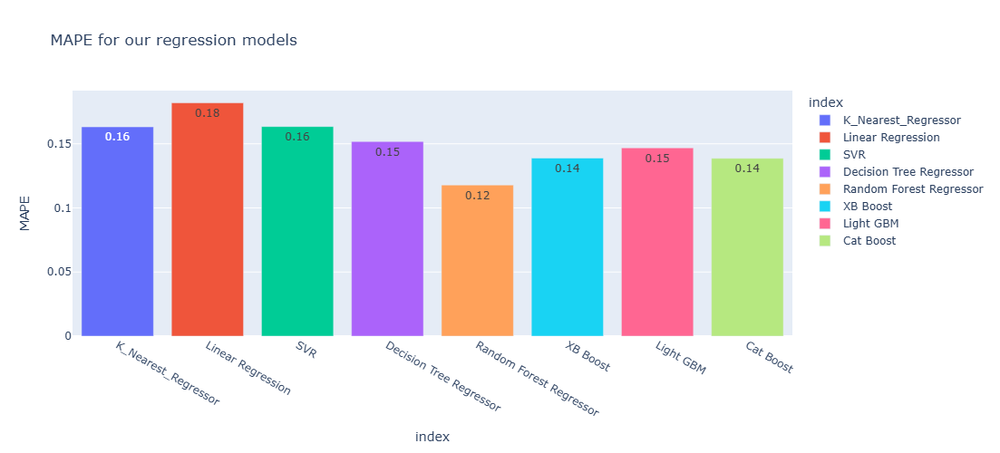

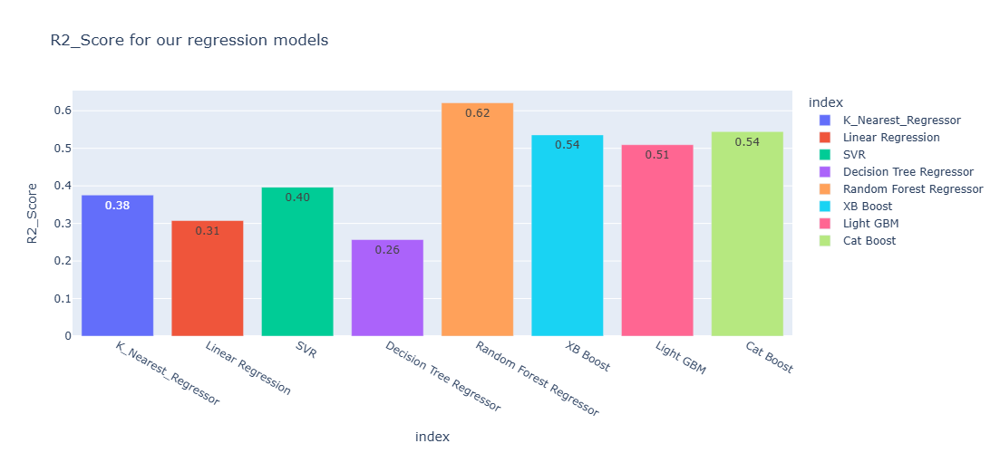

In [322]:
# Let us create a pandas data frame for our result values. It will help us in plotting the graphs.
results_df = pd.DataFrame(results).T.iloc[:,2:] 
# Transposing the dataframe is giving us more intuitive result. And since we need just MAPE and r2_score, we have sliced the dataframe accordingly.

# Creating a plotly bar graph for better interpretability
for columns in results_df.columns:
    fig = px.bar(results_df,
                 x = results_df.index,
                 y = results_df[columns],
                 color = results_df.index,
                 text = results_df[columns].values,
                 text_auto = '.2f',
                 title = f'{columns} for our regression models',
                 height = 500,
                 width = 1000)
    fig.show()

#### <u>Observations:</u> We can find out that **Random Forest** is performing well as compared to other algorithms. As, we are getting :-
* ##### **Mape** of around **<u>11.8 % </u>**
* ##### **R2 score** of around 0.62 which means that our model is able to explain **<u>62%</u>** of the variance.

#### Hyperparameter Tuning

##### We shall now see that impact of Hyperparameter Tuning on our models.

In [328]:
models_with_params = {
    
    'K_Nearest_Regressor': {
        'model': KNeighborsRegressor(),
        'params': {'n_neighbors': [3, 5, 7]}   # Tuning number of neighbors are 3, 5 and 7
    },
    'Linear Regression': {
        'model': LinearRegression(),
        'params': {}  # No hyperparameters required for Linear Regression
    },
    'SVR': {
        'model': SVR(),
        'params': {'C': [0.1, 1, 10], 'kernel': ['linear', 'poly', 'rbf']}  # Tuning C value as 0.1, 1, 10 and kernel as linear, polynomial, rbf
    },
    'Decision Tree Regressor': {
        'model': DecisionTreeRegressor(),
        'params': {'max_depth': [5, 10, 20], 'min_samples_split': [2, 5, 10]} # Tuning max depth and mininum samples split
    },
    'Random Forest Regressor': {
        'model': RandomForestRegressor(),
        'params': {'n_estimators': [50, 100, 150], 'max_depth': [10, 20]} # Tuning n_estimators (number of decision trees) and max_depth (depth of each tree)
    },
    'XG Boost': {
        'model': XGBRegressor(),
        'params': {'n_estimators': [50, 100], 'learning_rate': [0.01, 0.1]} # Tuning number of gradient boosted trees and learning rate
    },
    'Light GBM': {
        'model': LGBMRegressor(verbose=0),  # verbose is set to 0 to avoid displaying the iterartions.
        'params': {'n_estimators': [50, 100], 'learning_rate': [0.01, 0.1]} # Tuning number of trees and learning rate.
    },
    'Cat Boost': {
        'model': CatBoostRegressor(verbose=0),
        'params': {'iterations': [100, 200], 'learning_rate': [0.01, 0.1]} # Tuning number of iterations and learning rate.
    }
}

In [329]:
results_tuned = {}  # Created a dictionary to store the results of hyperparameter tuning
for name, model_info in models_with_params.items(): # Iterating through each key-value pair in our dictionary.
    grid_search = GridSearchCV(model_info['model'], model_info['params'], scoring = 'r2', cv = 5, n_jobs = -1)
    # Creating a grid search object with model and params info from our models_with_params dictionary with scoring parameter set as r2_score, 
    # cross-validation as 5 and n_jobs = -1 which depicts end to end job utilizing whole cpu.
    
    mod_grid = grid_search.fit(x_train_scaled, y_train_scaled) # Training grid search object for each model on our training data.
    best_model = mod_grid.best_estimator_  # finding the best model with tuned hyperparameters and storing it in a variable.
    y_pred_tuned = best_model.predict(x_test_scaled) # Making predictions from our tuned model
    mape_tuned = mean_absolute_percentage_error(y_test, np.expm1(y_pred_tuned)) # calculaing the MAPE on actual y_test and inverse transformed y_pred_tuned
    r2_tuned = r2_score(y_test, np.expm1(y_pred_tuned)) # Calculating R2 Score on actual y_test and inverse transformed y_pred_tuned.

    results_tuned[name] = {'Best_params' : mod_grid.best_params_,
                           'MAPE' : mape_tuned,
                           'R2_score' : r2_tuned}

In [336]:
# Display the results of hyperparameter tuning
results_tuned

{'K_Nearest_Regressor': {'Best_params': {'n_neighbors': 7},
  'MAPE': 0.1627108185366539,
  'R2_score': 0.39110240946116837},
 'Linear Regression': {'Best_params': {},
  'MAPE': 0.1819197153858994,
  'R2_score': 0.30761742209628906},
 'SVR': {'Best_params': {'C': 10, 'kernel': 'rbf'},
  'MAPE': 0.16132647327365604,
  'R2_score': 0.40525446483905947},
 'Decision Tree Regressor': {'Best_params': {'max_depth': 10,
   'min_samples_split': 10},
  'MAPE': 0.15126609232534238,
  'R2_score': 0.46012451556197853},
 'Random Forest Regressor': {'Best_params': {'max_depth': 20,
   'n_estimators': 150},
  'MAPE': 0.11855475107106382,
  'R2_score': 0.6187991457253905},
 'XG Boost': {'Best_params': {'learning_rate': 0.1, 'n_estimators': 100},
  'MAPE': 0.14748085962021784,
  'R2_score': 0.5022059735579245},
 'Light GBM': {'Best_params': {'learning_rate': 0.1, 'n_estimators': 100},
  'MAPE': 0.14682792438966596,
  'R2_score': 0.509628337729326},
 'Cat Boost': {'Best_params': {'iterations': 200, 'learn

In [337]:
# Let us create a pandas data frame for our result values. It will help us in plotting the graphs.
results_tuned_df = pd.DataFrame(results_tuned).T.iloc[:,1:] # To display only MAPE and r2_score
results_tuned_df

,MAPE,R2_score
K_Nearest_Regressor,0.162711,0.391102
Linear Regression,0.18192,0.307617
SVR,0.161326,0.405254
Decision Tree Regressor,0.151266,0.460125
Random Forest Regressor,0.118555,0.618799
XG Boost,0.147481,0.502206
Light GBM,0.146828,0.509628
Cat Boost,0.150398,0.490488


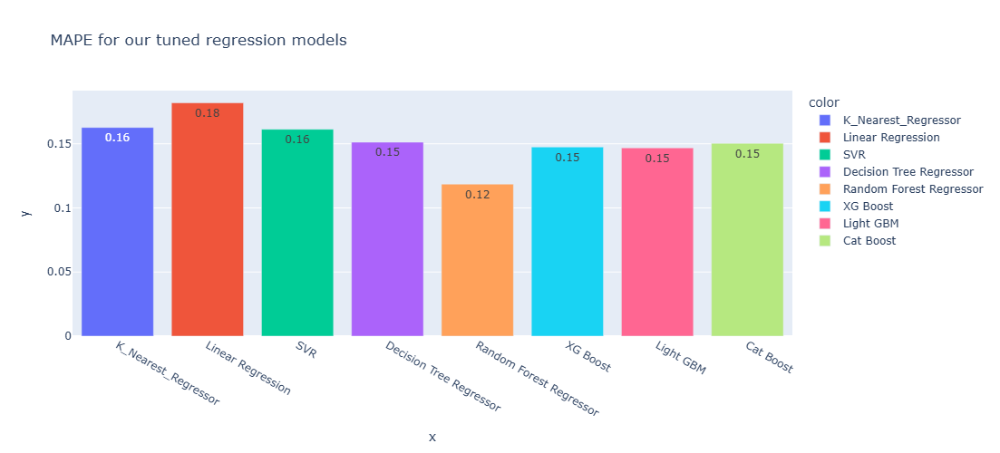

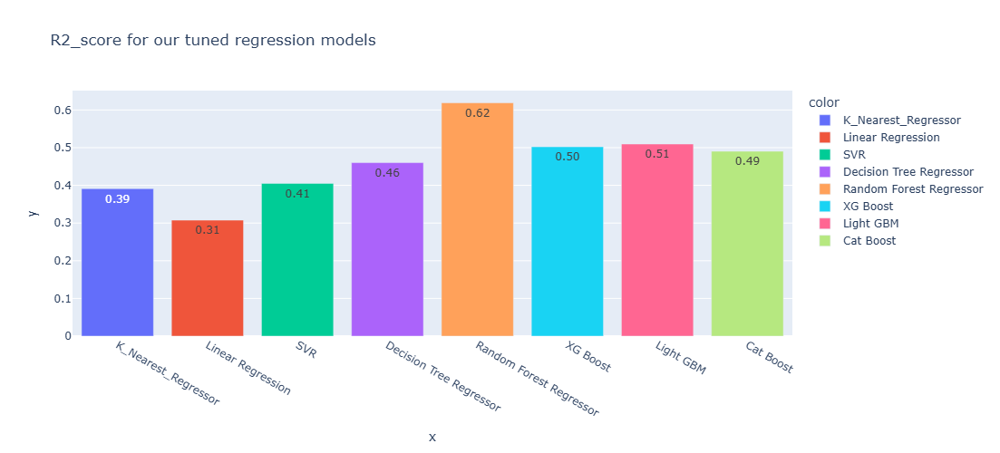

In [338]:
# Displaying the results of hyperparameter tuning using Plotly Bar chart
for columns in results_tuned_df.columns:
    fig = px.bar(results_df,
                 x = results_tuned_df.index,
                 y = results_tuned_df[columns],
                 color = results_tuned_df.index,
                 text = results_tuned_df[columns].values,
                 text_auto = '.2f',
                 title = f'{columns} for our tuned regression models',
                 height = 500,
                 width = 1000)
    fig.show()

##### <u>Observations:</u> We are getting more or less the same results as **Random Forest** is performing well as compared to other algorithms. As, we are getting :-
* ##### **Mape** of around **<u>11.8 % </u>**
* ##### **R2 score** of around 0.62 which means that our model is able to explain **<u>62%</u>** of the variance.

#### <u>Deep Neural network or Multi layer perceptron</u>

##### Since, now we have checked all the Machine Learning Algorithms, We shall now dive into the Deep Learning and build a MLP and test the performance of our model
##### to check if it outperform our ML algorithms.

In [345]:
# Building the Sequential model (fully connected model where layers will be added one by one)

mlp_model = Sequential() # Initializing the Sequential model
mlp_model.add(Dense(256, activation = 'relu', input_dim = x_train.shape[1]))
# Adding a Dense layer with 256 nuerons, 'relu' activation and input_shape = Number of independent features we have in this case, x_train.shape[1] = 7
mlp_model.add(Dropout(0.20))
# Adding a Dropout layer deactivating 20 % neurons
mlp_model.add(Dense(128, activation = 'relu'))
mlp_model.add(Dropout(0.20))
mlp_model.add(Dense(64, activation = 'relu'))
mlp_model.add(Dropout(0.20))
mlp_model.add(Dense(1, activation = 'linear')) # The activation function in the last layer should be 'Linear' for the Regression task.

# Compiling the model

mlp_model.compile(optimizer = 'adam',  # Taking optmizer as Adam.
                  loss = 'mse',         # Taking mean_squared_error as the loss value.
                  metrics = ['mae'])   # Taking mean_absolute_error as the metrics.

##### Now, before training our MLP let us initialize early stopping.
##### <u>**Early Stopping:**</u> It is used to stop the training iterations (epochs) when our given metric threshold is reached. We create an early stopping object which stops the current ongoing epochs, when our target metric, which is the validation metric reaches or stops at a paricular value (which is our patience value). This helps to monitor unnecessary iterations and reduce the training time.

In [346]:
early_stopping = EarlyStopping(monitor = 'val_loss', patience = 30, min_delta = 0.01, verbose = 1, restore_best_weights=True)
# Creating an early stopping object which stops the current ongoing epochs, when our validation mse reaches a value 30 times. min_delta is set 
# as 0.01 which is the minimum change in our validation metric to qualify as an improvement and verbose = 1 which means that some part of the 
# iterative steps are visible. restore_best_weights=True helps prevent overfitting and store the best weights after training.

# Training the MLP

history = mlp_model.fit(x_train_scaled,
                        y_train_scaled,
                        epochs = 500,
                        batch_size = 128,
                        callbacks = early_stopping,
                        validation_data = (x_test_scaled, y_test_scaled))
# We train our MLP on x_train_scaled and y_train_scaled with 500 epochs or iterations with batch_size = 128 and early stopping. Our validation data
# for this MLP model will just be our test set which is x_test_scaled, y_test_scaled.

Epoch 1/500
306/306 ━━━━━━━━━━━━━━━━━━━━ 12s 11ms/step - loss: 19.8385 - mae: 3.1039 - val_loss: 0.2608 - val_mae: 0.3802
Epoch 2/500
306/306 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.6454 - mae: 1.0250 - val_loss: 0.1846 - val_mae: 0.3381
Epoch 3/500
306/306 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1.4137 - mae: 0.9490 - val_loss: 0.1122 - val_mae: 0.2645
Epoch 4/500
306/306 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 1.2656 - mae: 0.9000 - val_loss: 0.1974 - val_mae: 0.3718
Epoch 5/500
306/306 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 1.1781 - mae: 0.8668 - val_loss: 0.0856 - val_mae: 0.2196
Epoch 6/500
306/306 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 1.0990 - mae: 0.8377 - val_loss: 0.1252 - val_mae: 0.2831
Epoch 7/500
306/306 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 1.0343 - mae: 0.8119 - val_loss: 0.1473 - val_mae: 0.3182
Epoch 8/500
306/306 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.9762 - mae: 0.7893 - val_loss: 0.0840 - val_mae: 0.2198
Epoch 9/500
306/306 ━━━━━━━━━━━━━━━━━━━━ 2s 5

In [349]:
# Making Predictions
y_pred_mlp_test = mlp_model.predict(x_test_scaled)

# Evaluating the model
mape_test_mlp = mean_absolute_percentage_error(y_test, np.expm1(y_pred_mlp_test))
r_score_test = r2_score(y_test, np.expm1(y_pred_mlp_test))
                        
# Printing the results
print(f'MAPE_testing --> {mape_test_mlp}')
print(f'R2 score testing --> {r_score_test}')

408/408 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
MAPE_testing --> 0.174235944286944
R2 score testing --> 0.31405764968116423


##### <u>Observations:</u> We are getting a very underwhelming performance from MLP. As, we are getting :-
* ##### **Mape** of around **<u>17.4 % </u>** which is not bad but,
* ##### **R2 score** of around 0.31 which means that our model is able to explain just **<u>31%</u>** of the variance in our data.

#### <u>We shall now focus on our best performing model i.e., **Random Forest** and do deep dive to find if we can improve our model.</u>

##### We shall check if our model is **Overfitting** or **Underfitting**,
* ##### Overfitting - When our model performs great on the training set but performs low on the test set, it is said to be **Overfitting**.
* ##### Underfitting - When our model perform poor on training as well as testing, it is said to be **Underfitting**.
##### As a general rule, a good model should be able to explain at least 65-70% of the variance in the data (r2 score should be at least **0.65**). Also,
* ##### If r2 score for training is greater than **0.1** (or 10%) as compared to r2 score for testing, we can say that the model is **overfitting** to the training data.
* ##### If r2 score for training is less than **0.65** and testing is also less than **0.65**, we can say that the model is **Underfitting**.

In [339]:
# Creating Random Forest model again 

In [341]:
random_forest = RandomForestRegressor() # Creating an object of Random forest regressor algorithm
model_rf = random_forest.fit(x_train_scaled, y_train_scaled) # Training our model on x_train_scaled and y_train_scaled
y_pred_train = model_rf.predict(x_train_scaled) # Making predictions on x_train_scaled data to find the training performance
y_pred_test = model_rf.predict(x_test_scaled) # Making predictions on x_test_scaled data to find the testing performance.
mape_train = mean_absolute_percentage_error(y_train, np.expm1(y_pred_train)) # calculating MAPE for training set.
mape_test = mean_absolute_percentage_error(y_test, np.expm1(y_pred_test)) # calculating MAPE for testing set.
r_score_train = r2_score(y_train, np.expm1(y_pred_train)) # Calculating R2 score for training data.
r_score_test = r2_score(y_test, np.expm1(y_pred_test)) # calculating R2 score for testing data.

# Printing Results
print(f'MAPE for training --> {mape_train}')
print(f'MAPE for testing --> {mape_test}')
print(f'R2 Score for training --> {r_score_train}')
print(f'R2 Score for testing --> {r_score_test}')

# Interpreting the results (Checking for Overfitting)
if np.abs(r_score_train - r_score_test) > 0.1:
    print('Model is Overfitting')
else:
    print('Model is Not Overfitting')

MAPE for training --> 0.04303888413818533
MAPE for testing --> 0.1176179810210307
R2 Score for training --> 0.9419919498478809
R2 Score for testing --> 0.6210661524786123
Model is Overfitting


##### Our model is overfitting to the data.

#### <u>**Feature Importance**</u>

##### We can also try to make use of Feature importance feature of Random Forest Algorithm which tell us that which features contribute more to the variance
##### of our model. We can then also use the finding of our statistical study to identify is we should remove any feature(s) to improve the performance of our model.

In [351]:
model_rf.feature_importances_ # Displaying feature importances, in probability terms

array([0.47652624, 0.17441697, 0.10809648, 0.10554637, 0.09261276,
       0.03620448, 0.00659671])

##### lets make these results more intuitive

In [354]:
for i, j in zip(x.columns, model_rf.feature_importances_): # combining the columns with their feature importance using zip()
    print(f'{i} --> {round(j*100,2)} percent') # printing the results in the form of percentages to make it more intuitive

Temperature --> 47.65 percent
Humidity --> 17.44 percent
Wind Speed --> 10.81 percent
general diffuse flows --> 10.55 percent
diffuse flows --> 9.26 percent
Air Quality Index (PM) --> 3.62 percent
Cloudiness --> 0.66 percent


##### We can cleary observe that the features '**Air Quality Index (PM)**' and '**Cloudiness**' contribute very less to the variance of our model around 4.28% combined.

##### Also, as per our Statistical analysis, we found our the the VIF (variance inflation factor) of **Air Quality Index (PM)** came out to be around **58.4**,
##### which is way higher than the acceptable threshold of 15.

##### *Based on both these findings, i.e., the feature importance and the statistical study, we can remove the features, **Air Quality Index (PM)** and **Cloudiness**.*

In [355]:
# making a copy of our data so that original data remains intact.
df_features_removed = df_no_outliers.copy()

# dropping Air Quality Index (PM) and Cloudiness.
df_features_removed.drop(['Air Quality Index (PM)', 'Cloudiness'], axis = 1, inplace = True)

df_features_removed.head()

,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Power Consumption in A Zone
0,6.79714,73.8,0.083,0.049742,0.112435,34055.69620
1,6.79714,74.5,0.083,0.067659,0.081580,29814.68354
2,6.79714,74.5,0.080,0.060154,0.095310,29128.10127
3,6.79714,75.0,0.083,0.087095,0.091667,28228.86076
4,6.79714,75.7,0.081,0.046884,0.081580,27335.69620


##### Let us study the impact of this change on our **Random Forest** model.

In [356]:
# defining x and y from our new dataset
x = df_features_removed[df_features_removed.columns[:-1]] 
y = df_features_removed[df_features_removed.columns[-1]] 

# splitting the data into training and testing
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.25, random_state = 15)

# Scaling the features
scaler = StandardScaler() # Creating an object of Standard Scaler.
x_train_scaled = scaler.fit_transform(x_train)  # fitting the data using the Standard scaler object and transforming x_train
x_test_scaled = scaler.transform(x_test) # appying the same  transformation on x_test

y_train_scaled = np.log1p(y_train)
y_test_scaled = np.log1p(y_test)

In [358]:
random_forest = RandomForestRegressor() # Creating an object of Random forest regressor algorithm
model_rf = random_forest.fit(x_train_scaled, y_train_scaled) # Training our model on x_train_scaled and y_train_scaled
y_pred_train = model_rf.predict(x_train_scaled) # Making predictions on x_train_scaled data to find the training performance
y_pred_test = model_rf.predict(x_test_scaled) # Making predictions on x_test_scaled data to find the testing performance.
mape_train = mean_absolute_percentage_error(y_train, np.expm1(y_pred_train)) # calculating MAPE for training set.
mape_test = mean_absolute_percentage_error(y_test, np.expm1(y_pred_test)) # calculating MAPE for testing set.
r_score_train = r2_score(y_train, np.expm1(y_pred_train)) # Calculating R2 score for training data.
r_score_test = r2_score(y_test, np.expm1(y_pred_test)) # calculating R2 score for testing data.

# Printing Results
print(f'MAPE for training --> {mape_train}')
print(f'MAPE for testing --> {mape_test}')
print(f'R2 Score for training --> {r_score_train}')
print(f'R2 Score for testing --> {r_score_test}')

MAPE for training --> 0.04247219041605047
MAPE for testing --> 0.11588294121770666
R2 Score for training --> 0.9421027042224233
R2 Score for testing --> 0.6239408125288031


##### <u>Observations:</u> Feature importance is also not helping us improve our model as we are getting more or less the same results:-
* ##### **Mape** of around **<u>11.6 % </u>**
* ##### **R2 score** of around 0.62 which means that our model is able to explain **<u>62%</u>** of the variance.

#### <u>PCA:</u>

##### PCA or principal component analysis is a Dimensionality reduction technique where features which can explain the majority of variance in our dataset, 
##### are transformed into new features. It helps us in eliminating less important features and hence improving our model.

##### Let us try to implement **PCA** and check if our model benifits from it.

In [364]:
pca = PCA(n_components = 0.95) # n_components is taken as 0.95 or features which can explain 95% of the variance are kept.
x_train_pca = pca.fit_transform(x_train_scaled) # Fitting and Transoforming training data.
x_test_pca = pca.transform(x_test_scaled) # Transform the test data.

# checking the number of components selected
print(f"Number of Principal Components Selected: {pca.n_components_}")

# Now let us train our model using the transformed data
random_forest = RandomForestRegressor()
mod_pca = random_forest.fit(x_train_pca, y_train_scaled)

# Making predictions on test and train
y_pred_train_pca = mod_pca.predict(x_train_pca)
y_pred_test_pca = mod_pca.predict(x_test_pca)

# Evaluating the model
mape_train_pca = mean_absolute_percentage_error(y_train, np.expm1(y_pred_train_pca))
mape_test_pca = mean_absolute_percentage_error(y_test, np.expm1(y_pred_test_pca))
r_score_train_pca = r2_score(y_train, np.expm1(y_pred_train_pca))
r_score_test_pca = r2_score(y_test, np.expm1(y_pred_test_pca))

# Printing the results
print(f'MAPE for training --> {mape_train_pca}')
print(f'MAPE for test --> {mape_test_pca}')
print(f'R2 score for training --> {r_score_train_pca}')
print(f'R2 score for testing --> {r_score_test_pca}')

Number of Principal Components Selected: 4
MAPE for training --> 0.048178134472295915
MAPE for test --> 0.13273661806176093
R2 score for training --> 0.9282243039363172
R2 score for testing --> 0.5170691197191005


##### <u>Observations:</u> We can see the performance of our model has dropped. As, we are getting :-
* ##### **Mape** of around **<u>13.2 % </u>**
* ##### **R2 score** of around 0.52 which means that our model is able to explain **<u>52%</u>** of the variance.

### <u>**Conclusion**</u>

In [368]:
##### These are our final performance metrics.
print(f'MAPE --> {round(mape_test,2)}')
print(f'R2 Score --> {round(r_score_test,2)}')

MAPE --> 0.12
R2 Score --> 0.62


#### Our best model so far is Random Forest for this data. for which we are getting,
* #### **MAPE (Mean Absolute Percentage Error)** of **12%**.
* #### **R2 score** of **62%**.